# Notebook Metadata

- **Notebook Name**: 01_eda.ipynb
- **Title**: MoneyLion DS Assessment  
- **Author**: Khoon Ching Wong
- **Created**: 2024-09-24
- **Last Modified**: 2025-09-25
- **Description**:  
  This notebook performs exploratory data analysis (EDA) on loan-level datasets by merging loan attributes, underwriting records and ACH payment data using unique IDs. The goal is to prepare and validate features for          downstream model training (see `02_model.ipynb`), where Optuna is applied for optimization to reduce institutional financial losses.
  <br>The workflow includes: data imports, data manipulation, exploratory data analysis (EDA), feature engineering
- **Inputs**:
  - `clarity_underwriting_variables.csv`
  - `loan.csv`
  - `payment.csv`
- **Output**:
  - Masked correlation matrix: `temp/Loan-level/correlation.csv`
  - Correlation heatmap as HTML: `temp/Loan-level/correlation_heatmap.html`
  - Cleaned matched dataset: `temp/clean_df.parquet`  
- **Repository/Project Link**: https://github.com/wongkhoon/DS-Assessment/tree/main/MoneyLion/notebooks

# Import libraries

In [1]:
import IPython.core.interactiveshell 

import gc
import sys
import os
import multiprocessing
import psutil
import platform

from IPython.display import display, Markdown

import pandas as pd
import numpy as np
from functools import reduce
from collections import Counter

import matplotlib.pyplot as plt
from matplotlib.ticker import MaxNLocator

import plotly.express as px
import plotly.graph_objects as go
from itertools import product

import seaborn as sns

from dython.nominal import associations

import calendar
import pathlib, subprocess, urllib
import session_info

# Display settings configuration
- Configure display settings for enhanced output in Jupyter notebook

In [2]:
# Display full output in output cell, not only the last result
IPython.core.interactiveshell.InteractiveShell.ast_node_interactivity = "all"

# Maximum rows and columns of Pandas DataFrame for current setting
#print(pd.options.display.max_rows)
#print(pd.options.display.max_columns)

# Print all the contents of a Pandas DataFrame
#pd.set_option("display.max_rows", None) # Print unlimited number of rows by setting to None, default is 10
pd.set_option("display.max_columns", None) # don't truncate columns to display all of them by setting to None
pd.set_option("display.width", None) # Auto-detect the width of DataFrame to display all columns in single line by setting to None
pd.set_option("display.max_colwidth", None) # Auto detect the maximum size of column and print contents of that column without truncation

# Reset to defaults if needed
# pd.reset_option("display.*")

# Create Temporary Directory for Intermediate Files
Create a `temp` directory to store intermediate files.  
Examples include:
- `correlation.csv` for reference
- `clean_df.parquet` for reloading in `02_model.ipynb` during Optuna optimization, model training and reporting

In [3]:
# Create the directory path if it doesn't exist and raise no errors if already exist
os.makedirs("temp/Loan-level", exist_ok = True)
temp_dir = "temp/Loan-level"

# Functions

In [4]:
def basic_overview_df(df, name = "data.csv"):
    
    """
    Provide a quick overview of a given Pandas DataFrame.
    
    Parameters
    ----------
    df : pd.DataFrame 
        The DataFrame to analyze
    name : str, optional
        Name to display for the DataFrame (default: "data.csv")
    
    Returns
    -------
    pd.DataFrame
        The DataFrame with string columns trimmed
    
    Description
    -----------
    - Strips leading/trailing spaces from string columns
    - Reports duplicate entries
    - Shows DataFrame shape
    - Displays first 5 rows
    - Provides basic information about columns
    """
  
    # Trim leading and trailing spaces from string columns to ensure data consistency, 
    # especially when matching ID columns and preventing unintended discrepancies
    for col in df.select_dtypes(include = ["object"]).columns:
        df[col] = df[col].map(lambda x: x.strip() if isinstance(x, str) else x)
        
    display(Markdown(f'<span style = "font-size: 18px; font-weight: bold;"><u>{name}</u></span>'))

    print(f'- {df.duplicated().sum()} duplicate rows.')
    
    print(f'- {df.shape[0]} entries and {df.shape[1]} columns.\n')

    print(f'- First 5 entries:\n')
    display(df.head())  # Use display() for better output in JupyterLab

    print(f'\n- Data Information:\n')
    df.info(verbose = True)

In [5]:
def print_dup_ids(df, col, df_name):

    """
    Check ID occurences in a Pandas DataFrame column for proper data join.
       
    Useful for checking data quality before joins and identifying potential duplicate records.
    
    Parameters
    ----------
    df : pd.DataFrame
        Input DataFrame to check for duplicates.
    col : str
        Name of the column to check for duplicate values.
    df_name : str, optional
        Name to display in output messages.

    """
    
    # Get matching IDs with >1 occurrence and their counts
    dups = [(loanId, cnt) for loanId, cnt in Counter(df[col]).items() if cnt > 1]
    
    # Sort duplicates by count in descending order
    dups.sort(key = lambda x: x[1], reverse = True)   
    
    # Print the IDs and their counts
    for loanId, cnt in dups:
        print(f'{df_name}.{col}:{loanId}, Occurrences:{cnt}')

    del dups

In [6]:
def anal_df(df):

    """
    Analyze a pandas DataFrame for duplicates, shape, data types and missing values.
    
    Provides a comprehensive overview of the DataFrame including:
    - First few rows
    - Duplicate row count
    - Shape (rows and columns)
    - Missing values analysis with proportions
    - Data types for each column
    
    Parameters
    ----------
    df : pd.DataFrame
        The DataFrame to analyze.
       
    """    
    
    display(Markdown(f'<span style = "font-size: 18px; font-weight: bold;"><u>DataFrame Overview</u></span>'))
    print(f'- First 5 entries:')
    display(df.head())  
    
    print(f'- {df.duplicated().sum()} duplicate rows.')
    print(f'- {df.shape[0]} entries, {df.shape[1]} columns.')
    
    # Get missing values and their proportion
    missing_val = df.isnull().sum()
    missing_prop = (missing_val / len(df)) * 100
    
    # Get data types
    dtype_series = df.dtypes
    dtype_df = pd.DataFrame(dtype_series).reset_index()
    dtype_df.columns = ["Column", "Dtype"]

    # Combine missing values and data types into a single DataFrame
    missing_df = pd.DataFrame({"Missing Values (n)": missing_val, "Proportion (%)": missing_prop})
    
    # Include data types in the missing_df
    missing_df =  missing_df.join(dtype_df.set_index("Column"), on = missing_df.index)

    # Drop the redundant 'key_0' column
    missing_df = missing_df.drop(columns = "key_0", errors = "ignore")
    
    # Sort the df by the number of missing values
    missing_df = missing_df.sort_values(by = "Missing Values (n)", ascending = False)

    # Print the results
    print(f'- Check missing values and data types:')
    print(missing_df.to_string())
    
    # Clean up variables
    del missing_val, missing_prop, dtype_df

In [7]:
def is_bool_nan_col(col):
 
    """
    Check if a column contains only boolean values (True/False) and/or NaN values.
    
    This function is to identify columns that can be converted to nullable boolean dtype for memory optimization and type consistency 
    in downstream processing.
    
    Parameters
    ----------
    col : pd.Series or np.ndarray
        The column or array to check for boolean values.
        
    """

    # Get unique values excluding NaN/null values
    # dropna() removes all NaN/null values
    # unique() returns array of unique values
    # set() converts to set for efficient comparison    
    uniq_vals = set(col.dropna().unique())

    # Check if unique values are subset of {True, False}
    # <= operator for sets checks if left side is subset of right side
    # Returns True if uniq_vals only contains True and/or False
    # Returns True if uniq_vals is empty (all values were NaN)    
    return uniq_vals <= {True, False}

In [8]:
def boxplt_and_summary_stats(df, target_col, feat_col, title, y_min, y_max, step):
    
    """
    Generate a boxplot and summary statistics for a feature grouped by binary target.
    
    Creates a side-by-side boxplot comparing the distribution of a feature between two target groups (0: safe, 1: Risky), 
    along with comprehensive summary statistics including range and IQR.
    
    Parameters
    ----------
    df : pd.DataFrame
        Input DataFrame containing the data. Must include both target and feature columns specified.
    target_col : str
        Name of the binary target column used for grouping. Expected to contain values 0 (safe) and 1 (Risky).
    feat_col : str
        Name of the feature column to analyze and plot. Can be numeric continuous or discrete data.
    title : str
        Title for the boxplot. Should be descriptive of the analysis being
        performed.
    y_min : int or float
        Minimum value for y-axis range. Sets the lower bound of the plot.
    y_max : int or float
        Maximum value for y-axis range. Sets the upper bound of the plot.
    step : int or float
        Interval between y-axis tick marks. Determines tick spacing.
                    
    Notes
    -----
    - Rows with missing values in either target or feature columns are removed
    - Boxplot includes:
        * Notched boxes showing confidence interval of median
        * Mean markers (white squares with cyan edges)
        * Median lines (gold color)
        * Color coding: green for safe, red for Risky
    - Summary statistics include: count, mean, std, min, 25%, 50%, 75%, max, range (max-min) and IQR (75%-25%)
    - Memory is explicitly cleared after plotting to prevent memory leaks

    """
    
    # Remove rows with missing vals (NaN) in target/feature cols as Matplotlib doesn't automatically handle them
    df = df[[target_col, feat_col]].dropna()
    
    # Prepare data for boxplot: separate feature values based on the target column
    cols = [df[df[target_col] == 0][feat_col].tolist(),
            df[df[target_col] == 1][feat_col].tolist()]

    # Create figure and axis
    fig,ax = plt.subplots(figsize = (7, 5))

    # Boxplot
    boxplt = ax.boxplot(cols,
                        notch = True,  # Add notch for confidence interval of the median
                        patch_artist = True,  # Enable color filling for boxes
                        showmeans = True,  # Display mean marker
                        meanprops = {"marker": "s", "markerfacecolor": "white", "markeredgecolor": "cyan"},
                        medianprops={"color": "gold"}) # Change median color to red

    # Set x-axis labels, y-axis label and title
    ax.set_xticklabels(["Safe", "Risky"], size = 12)
    ax.set_xlabel("Loans", size = 12)
    ax.set_ylabel(feat_col, size = 12)
    ax.set_title(title, size = 14)

    # Add colors to boxes
    colors = ["#99FF99", "#FF9999"]
    for patch, color in zip(boxplt["boxes"], colors):
        patch.set_facecolor(color)

    # Add legend for median and mean
    ax.legend([boxplt["medians"][0], boxplt["means"][0]], ["Median", "Mean"], loc = "upper right")

    # Set y-axis limits and ticks using MaxNLocator
    ax.set_ylim(y_min, y_max)
    ax.yaxis.set_major_locator(MaxNLocator(integer = True, prune = "lower"))
    ax.set_yticks(np.arange(y_min, y_max + 1, step))  # Set ticks at intervals of 'step'
   
    plt.show()

    # Summary statistics
    summary_stats = df.groupby(target_col)[feat_col].describe(include = "all")

    # Rename index for better readability
    summary_stats.rename(index = {0: "Safe", 1: "Risky"}, inplace = True)

    # Format the summary statistics
    def fmt_stats(df):      
        df["range"] = df["max"] - df["min"]
        df["IQR"] = df["75%"] - df["25%"]
    
        # Define formatting for each column
        fmts = {"count": "{:.0f}", "mean": "{:.3f}", "std": "{:.3f}", "min": "{:.3f}",
                "25%": "{:.3f}", "50%": "{:.3f}", "75%": "{:.3f}", "max": "{:.3f}", 
                "range": "{:.3f}", "IQR": "{:.3f}"
               }

        # Apply column-wise formatting 
        for col, fmt in fmts.items():
            if col in df.columns:
                df[col] = df[col].apply(lambda x: fmt.format(x) if pd.notnull(x) else x)
        return df

    display(Markdown(f'**- Summary Statistics:**'))
    display(fmt_stats(summary_stats))

    del fig, ax, cols, boxplt, colors, patch, color

In [9]:
def plot_stacked_bar(clean_df, feature, observed = False, dropna = False, maxtickval = 13):

    """
    Create an interactive stacked bar chart for categorical feature analysis by target groups.
    
    Generates a stacked bar chart showing the distribution of a categorical feature across binary target groups (0: Safe, 1: Risky). 
    Each bar shows both the count and proportion of target groups within each category. 
    Includes a detailed summary statistics table.
    
    Parameters
    ----------
    clean_df : pd.DataFrame
        Input DataFrame containing the categorical feature and a 'target' column.
        The target column must contain binary values (0 and 1).
    feature : str
        Name of the categorical column to analyze. Can be any data type that can be converted to categorical (string, numeric, etc.). 
        NaN values are supported.
    observed : bool, default = False
        If True, only show observed values for categorical groupers, improving performance with high-cardinality categorical data. 
        If False, show all categorical values even if they have zero counts.
    dropna : bool, default = False
        If True, NaN/null values in the grouping columns are excluded from the result.
        If False, NaN values are treated as a separate category labeled "NaN".
    maxtickval : int, default = 13
        Maximum value for y-axis tick marks in thousands. 
        For example, 13 creates ticks from 0 to 12,000. Must be a positive integer.
            
    Notes
    -----
    - Color scheme: Green (#99FF99) for safe, Red (#FF9999) for risky
    - Bars are sorted by total count in descending order for better visibility
    - Proportions are displayed on each segment with 2 decimal precision
    - NaN values are converted to string "NaN" for proper visualization
    - The function includes memory cleanup to prevent memory leaks in notebooks
    - Summary table shows both counts and proportions with proper formatting
    
    Implementation Details
    ---------------------
    The function performs the following steps:
    1. Groups data by feature and target to calculate counts
    2. Calculates proportions within each feature category
    3. Converts data types for proper visualization
    4. Handles NaN values by converting them to a visible category
    5. Creates an interactive stacked bar chart with Plotly
    6. Generates a pivoted summary statistics table
    7. Cleans up memory after execution
    
    """
    
    # Groupby with observed parameter
    df = clean_df.groupby([feature, "target"], observed = observed, dropna = dropna).size().reset_index()

    # Calculate percentages
    df["percentage"] = (clean_df.groupby([feature, "target"],observed = observed, dropna = dropna)
                        .size()
                        .groupby(level = 0, observed = observed, dropna = dropna)
                        .apply(lambda x: 100 * x / float(x.sum()))
                        .values
                       )

    # Create a dictionary that maps the variable names to the desired data types
    vars_typ = {feature: "category", "target": "string"}
    df = df.astype(vars_typ)

    # Rename columns
    df.columns = [feature, "target", "Counts", "Proportion (%)"]

    # Add NaN category and fill missing values
    df[feature] = df[feature].cat.add_categories("NaN")
    df[feature] = df[feature].fillna("NaN")

    # Sort by Counts in descending order
    df.sort_values(by = "Counts", ascending = False, inplace = True)                                                        
    
    # Create the bar plot
    fig = px.bar(df,
                 x = feature,
                 y = ["Counts"],
                 color = "target",
                 text = df["Proportion (%)"].apply(lambda x: "{0:1.2f}%".format(x)),
                 color_discrete_map = {"0": "#99FF99", "1": "#FF9999"},
                 category_orders = {"target": ["0", "1"]},
                )

    # Update layout
    fig = fig.update_layout(height = 500,
                            width = 1000,
                            title_x = 0.5,
                            barmode = "stack",
                            legend = dict(yanchor = "top",
                                          y = 0.98,
                                          xanchor = "right",
                                          x = 0.99,
                                          title_text = "Loans",
                                          title_font = dict(size = 14),
                                          itemsizing = "constant",
                                          traceorder = "reversed" # Reverse the order of legend items
                                         ),
                           )

    """
    #tickvals: Contains both low-range (0-100 in steps of 10) and high-range (1000 - 24000 in steps of 1000) values.
    tickvals = [i * 10 for i in range(11)] + [i * 1000 for i in range(1, 25)] 
    ticktext = [str(i) for i in range(0, 101, 10)] + [str(i) for i in range(1000 , 25000, 1000)]   
    """;
      
    # Update y-axis with dynamic tickvals and ticktext
    fig = fig.update_yaxes(title_text="Count (in 1,000)",
                           tickvals = [i * 1000 for i in range(0, maxtickval)],  # Define tick positions corresponding to 1k, 2k, ..., 12k
                           ticktext = [str(i) for i in range(0, maxtickval)]  # Define tick labels as 1, 2, ..., 12
                          )
    
    # Update legend values
    fig = fig.for_each_trace(lambda t: t.update(name = "Safe" if t.name == "0" else "Risky"))

    # Show the figure
    fig.show()
    
    display(Markdown(f'**- Summary Statistics:**'))
    #display(df.sort_values(by = [feature, "target"], ascending = [True, False]).reset_index(drop = True))
    display(df.sort_values(by = [feature, "target"], ascending = [True, False])  # Sort by feature first, then by target (descending)
            .pivot(index = feature, columns = "target", values = ["Counts", "Proportion (%)"])  # Reshape 
            .rename(columns = {"0": "Safe", "1": "Risky"}, level = 1) 
            .assign(**{"Counts": lambda x: x["Counts"].astype(int),  # Convert Counts to integer
                       "Proportion (%)": lambda x: x["Proportion (%)"].round(3)})  # Round Proportion to 4 decimal places
            .assign(total_count = lambda x: x["Counts"].sum(axis = 1))  # Compute total count per feature
            .sort_values(by = "total_count", ascending = False)  # Sort by total count in descending order
            .drop(columns = "total_count")  # Remove the temporary total_count column after sorting
            .swaplevel(axis = 1)  # Swap multi-index levels for better readability
            .sort_index(axis = 1)  # Sort columns properly
           )
    
    del fig, df, vars_typ, maxtickval

# Import csv data files
- `clarity_underwriting_variables.csv`
- `loan.csv`
- `payment.csv`

In [10]:
"""
# Print current working directory
print("Current working directory:", os.getcwd())
""";

In [11]:
# Load CSV files into pandas dfs
cuv_df = pd.read_csv("./data/data/clarity_underwriting_variables.csv",
                     low_memory = False)  # Ensure accurate data types for all columns despite the cost of increased memory usage

loan_df = pd.read_csv("./data/data/loan.csv",
                      parse_dates = ["applicationDate", "originatedDate"],
                      date_format = "ISO8601") # Up to millisecond precision -> yyyy-mm-dd hh:mm:ss.sss

payment_df = pd.read_csv("./data/data/payment.csv",
                         parse_dates = ["paymentDate"],
                         date_format = "ISO8601") # Up to millisecond precision -> yyyy-mm-dd hh:mm:ss.sss

# Data overview

## loan.csv

In [12]:
basic_overview_df(loan_df, name = "loan.csv")

<span style = "font-size: 18px; font-weight: bold;"><u>loan.csv</u></span>

- 0 duplicate rows.
- 577682 entries and 19 columns.

- First 5 entries:



,loanId,anon_ssn,payFrequency,apr,applicationDate,originated,originatedDate,nPaidOff,approved,isFunded,loanStatus,loanAmount,originallyScheduledPaymentAmount,state,leadType,leadCost,fpStatus,clarityFraudId,hasCF
0,LL-I-07399092,beff4989be82aab4a5b47679216942fd,B,360.0,2016-02-23 17:29:01.940,False,NaT,0.0,False,0,Withdrawn Application,500.0,978.27,IL,bvMandatory,6,NaN,5669ef78e4b0c9d3936440e6,1
1,LL-I-06644937,464f5d9ae4fa09ece4048d949191865c,B,199.0,2016-01-19 22:07:36.778,True,2016-01-20 15:49:18.846,0.0,True,1,Paid Off Loan,3000.0,6395.19,CA,prescreen,0,Checked,569eb3a3e4b096699f685d64,1
2,LL-I-10707532,3c174ae9e2505a5f9ddbff9843281845,B,590.0,2016-08-01 13:51:14.709,False,NaT,0.0,False,0,Withdrawn Application,400.0,1199.45,MO,bvMandatory,3,NaN,579eab11e4b0d0502870ef2f,1
3,LL-I-02272596,9be6f443bb97db7e95fa0c281d34da91,B,360.0,2015-08-06 23:58:08.880,False,NaT,0.0,False,0,Withdrawn Application,500.0,1074.05,IL,bvMandatory,3,NaN,555b1e95e4b0f6f11b267c18,1
4,LL-I-09542882,63b5494f60b5c19c827c7b068443752c,B,590.0,2016-06-05 22:31:34.304,False,NaT,0.0,False,0,Rejected,350.0,814.37,NV,bvMandatory,3,NaN,5754a91be4b0c6a2bf424772,1



- Data Information:

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 577682 entries, 0 to 577681
Data columns (total 19 columns):
 #   Column                            Non-Null Count   Dtype         
---  ------                            --------------   -----         
 0   loanId                            577426 non-null  object        
 1   anon_ssn                          577682 non-null  object        
 2   payFrequency                      576409 non-null  object        
 3   apr                               573760 non-null  float64       
 4   applicationDate                   577682 non-null  datetime64[ns]
 5   originated                        577682 non-null  bool          
 6   originatedDate                    46044 non-null   datetime64[ns]
 7   nPaidOff                          577658 non-null  float64       
 8   approved                          577682 non-null  bool          
 9   isFunded                          577682 non-null  int64         
 10  loanStatus

In [13]:
# Check: 
#loan_df[loan_df["loanId"]=="LL-I-18226935"] #yyyy-mm-dd hh:mm:ss 

## payment.csv

In [14]:
basic_overview_df(payment_df, name = "payment.csv")

<span style = "font-size: 18px; font-weight: bold;"><u>payment.csv</u></span>

- 0 duplicate rows.
- 689364 entries and 9 columns.

- First 5 entries:



,loanId,installmentIndex,isCollection,paymentDate,principal,fees,paymentAmount,paymentStatus,paymentReturnCode
0,LL-I-00000021,1,False,2014-12-19 05:00:00,22.33,147.28,169.61,Checked,NaN
1,LL-I-00000021,2,False,2015-01-02 05:00:00,26.44,143.17,169.61,Checked,NaN
2,LL-I-00000021,3,False,2015-01-16 05:00:00,31.30,138.31,169.61,Checked,NaN
3,LL-I-00000021,4,False,2015-01-30 05:00:00,37.07,132.54,169.61,Checked,NaN
4,LL-I-00000021,5,False,2015-02-13 05:00:00,43.89,125.72,169.61,Checked,NaN



- Data Information:

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 689364 entries, 0 to 689363
Data columns (total 9 columns):
 #   Column             Non-Null Count   Dtype         
---  ------             --------------   -----         
 0   loanId             689364 non-null  object        
 1   installmentIndex   689364 non-null  int64         
 2   isCollection       689364 non-null  bool          
 3   paymentDate        689364 non-null  datetime64[ns]
 4   principal          689364 non-null  float64       
 5   fees               689364 non-null  float64       
 6   paymentAmount      689364 non-null  float64       
 7   paymentStatus      525307 non-null  object        
 8   paymentReturnCode  31533 non-null   object        
dtypes: bool(1), datetime64[ns](1), float64(3), int64(1), object(3)
memory usage: 42.7+ MB


## clarity_underwriting_variables.csv

In [15]:
# Shorten long original column names 

# Prefixes to convert to cfinq., cfind., cfindvrfy. 
prefix_map = {".underwritingdataclarity.clearfraud.clearfraudinquiry.": "cfinq.",
              ".underwritingdataclarity.clearfraud.clearfraudindicator.": "cfind.",
              ".underwritingdataclarity.clearfraud.clearfraudidentityverification.": "cfindvrfy."
             }

cuv_df.rename(columns = lambda col: 
              # Replace only the first occurrence of each prefix if column starts with prefix
              next((col.replace(orig, new, 1) for orig, new in prefix_map.items() if col.startswith(orig)),
                   col # If no prefix matches, keep the column name unchanged
                  ),
          inplace = True)

basic_overview_df(cuv_df, name = "clarity_underwriting_variables.csv")

del prefix_map

<span style = "font-size: 18px; font-weight: bold;"><u>clarity_underwriting_variables.csv</u></span>

- 0 duplicate rows.
- 49752 entries and 54 columns.

- First 5 entries:



,cfinq.thirtydaysago,cfinq.twentyfourhoursago,cfinq.oneminuteago,cfinq.onehourago,cfinq.ninetydaysago,cfinq.sevendaysago,cfinq.tenminutesago,cfinq.fifteendaysago,cfinq.threesixtyfivedaysago,cfind.inquiryonfilecurrentaddressconflict,cfind.totalnumberoffraudindicators,cfind.telephonenumberinconsistentwithaddress,cfind.inquiryageyoungerthanssnissuedate,cfind.onfileaddresscautious,cfind.inquiryaddressnonresidential,cfind.onfileaddresshighrisk,cfind.ssnreportedmorefrequentlyforanother,cfind.currentaddressreportedbytradeopenlt90days,cfind.inputssninvalid,cfind.inputssnissuedatecannotbeverified,cfind.inquiryaddresscautious,cfind.morethan3inquiriesinthelast30days,cfind.onfileaddressnonresidential,cfind.creditestablishedpriortossnissuedate,cfind.driverlicenseformatinvalid,cfind.inputssnrecordedasdeceased,cfind.inquiryaddresshighrisk,cfind.inquirycurrentaddressnotonfile,cfind.bestonfilessnissuedatecannotbeverified,cfind.highprobabilityssnbelongstoanother,cfind.maxnumberofssnswithanybankaccount,cfind.bestonfilessnrecordedasdeceased,cfind.currentaddressreportedbynewtradeonly,cfind.creditestablishedbeforeage18,cfind.telephonenumberinconsistentwithstate,cfind.driverlicenseinconsistentwithonfile,cfind.workphonepreviouslylistedascellphone,cfind.workphonepreviouslylistedashomephone,cfindvrfy.ssnnamematch,cfindvrfy.nameaddressmatch,cfindvrfy.phonematchtype,cfindvrfy.ssnnamereasoncodedescription,cfindvrfy.phonematchresult,cfindvrfy.nameaddressreasoncodedescription,cfindvrfy.phonematchtypedescription,cfindvrfy.overallmatchresult,cfindvrfy.phonetype,cfindvrfy.ssndobreasoncode,cfindvrfy.ssnnamereasoncode,cfindvrfy.nameaddressreasoncode,cfindvrfy.ssndobmatch,cfindvrfy.overallmatchreasoncode,clearfraudscore,underwritingid
0,8.0,2.0,2.0,2.0,8.0,2.0,2.0,5.0,10.0,False,2.0,True,False,False,True,False,False,False,False,False,False,False,False,False,NaN,False,False,False,False,False,1.0,False,False,False,False,NaN,False,False,match,partial,M,NaN,unavailable,(A8) Match to Last Name only,(M) Mobile Phone,partial,NaN,NaN,NaN,A8,match,6.0,871.0,54cbffcee4b0ba763e43144d
1,5.0,2.0,2.0,2.0,11.0,2.0,2.0,4.0,21.0,True,3.0,True,False,False,False,False,False,False,False,False,False,False,False,False,NaN,False,False,True,False,False,1.0,False,False,False,False,NaN,False,False,match,mismatch,M,NaN,unavailable,NaN,(M) Mobile Phone,partial,NaN,NaN,NaN,NaN,match,11.0,397.0,54cc0408e4b0418d9a7f78af
2,9.0,4.0,2.0,3.0,10.0,8.0,2.0,9.0,25.0,False,3.0,True,False,False,False,False,False,False,False,False,False,False,False,False,NaN,False,False,False,False,False,2.0,False,False,False,False,NaN,True,False,match,match,M,NaN,unavailable,NaN,(M) Mobile Phone,match,NaN,NaN,NaN,NaN,match,1.0,572.0,54cc0683e4b0418d9a80adb6
3,3.0,2.0,2.0,2.0,9.0,2.0,2.0,2.0,9.0,False,1.0,True,False,False,False,False,False,False,False,False,False,False,False,False,NaN,False,False,False,False,False,1.0,False,False,False,False,NaN,False,False,match,mismatch,M,NaN,unavailable,NaN,(M) Mobile Phone,partial,NaN,NaN,NaN,NaN,match,11.0,838.0,54cc0780e4b0ba763e43b74a
4,5.0,5.0,2.0,2.0,6.0,5.0,2.0,5.0,6.0,False,1.0,True,False,False,False,False,False,False,False,False,False,False,False,False,NaN,False,False,False,False,False,1.0,False,False,False,False,NaN,False,False,match,match,M,NaN,unavailable,NaN,(M) Mobile Phone,match,NaN,NaN,NaN,NaN,match,1.0,768.0,54cc1d67e4b0ba763e445b45



- Data Information:

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 49752 entries, 0 to 49751
Data columns (total 54 columns):
 #   Column                                           Non-Null Count  Dtype  
---  ------                                           --------------  -----  
 0   cfinq.thirtydaysago                              49750 non-null  float64
 1   cfinq.twentyfourhoursago                         49750 non-null  float64
 2   cfinq.oneminuteago                               49750 non-null  float64
 3   cfinq.onehourago                                 49750 non-null  float64
 4   cfinq.ninetydaysago                              49750 non-null  float64
 5   cfinq.sevendaysago                               49750 non-null  float64
 6   cfinq.tenminutesago                              49750 non-null  float64
 7   cfinq.fifteendaysago                             49750 non-null  float64
 8   cfinq.threesixtyfivedaysago                      49750 non-null  float64
 9   cfind.

# Data merging/combination
- Including data preprocessing/transformation as appropriate

In [16]:
# Check:

# Every row represents a unique underwriting case i.e. underwritingid
#print_dup_ids(cuv_df, "underwritingid", "cuv_df") 

# A unique underwriting case i.e. clarityFraudId  may involve multiple loans i.e. loanId
#print_dup_ids(loan_df, "clarityFraudId", "loan_df") 
#print_dup_ids(loan_df,"loanId", "loan_df") 
"""
The maximum number of loans for underwriting is 15 and the minimum is 2
""";

#print_dup_ids(payment_df, "loanId", "payment_df") 
"""
Maximum number of payment entries = 105, minimum is 3
""";

## cuv_df + loan_df
- Retrieve all rows from both [cuv_df](#clarity_underwriting_variables.csv) and [loan_df](#loan.csv), including those with matching or non-matching IDs. i.e. `cuv_df.underwritingid` and `loan_df.clarityFraudId`

In [17]:
# Separate rows from cuv_df：with or without underwritingid to avoid incorrect merging/combination
cuv_w_id = cuv_df[cuv_df["underwritingid"].notnull()]  
cuv_wo_id = cuv_df[cuv_df["underwritingid"].isnull()]  

# Separate rows from loan_df：with or without clarityFraudId to avoid incorrect merging/combination
loan_w_id = loan_df[loan_df["clarityFraudId"].notnull()]  
loan_wo_id = loan_df[loan_df["clarityFraudId"].isnull()] 

dfs = {"w/ cuv_df.underwritingid": cuv_w_id,
       "w/o cuv_df.underwritingid": cuv_wo_id,
       "w/ loan_df.clarityFraudId": loan_w_id,
       "w/o loan_df.clarityFraudId": loan_wo_id}

for name, df in dfs.items():
    if name == "w/ clarityFraudId":
        #uniq_cnt = df["clarityFraudId"].nunique()  # Replace clarityFraudId with the actual ID column name
        display(Markdown(f'**- {name}: {df.shape[0]} rows with total unique *clarityFraudId* of {df["clarityFraudId"].nunique()}**'))
        #print(f'{start}{name}: {df.shape[0]} rows with total unique clarityFraudId of {df["clarityFraudId"].nunique()}{end}')
    else:
        display(Markdown(f'**- {name}: {df.shape[0]} rows**'))
        #print(f'{start}{name}: {df.shape[0]} rows{end}')

del dfs, name, df

**- w/ cuv_df.underwritingid: 49752 rows**

**- w/o cuv_df.underwritingid: 0 rows**

**- w/ loan_df.clarityFraudId: 357693 rows**

**- w/o loan_df.clarityFraudId: 219989 rows**

In [18]:
# Retrieve rows with non-missing underwritingid and clarityFraudId from both dataframes, either matching or non-matching
merged_df = pd.merge(cuv_w_id,
                     loan_w_id,
                     left_on = "underwritingid",
                     right_on = "clarityFraudId",
                     how = "outer",
                     indicator = True)

# Recode merging indicator
merged_df = merged_df.rename(columns = {"_merge": "cuv_loan_ind"}).assign(cuv_loan_ind = merged_df["_merge"]
                                                                          .cat
                                                                          .rename_categories({"left_only": "in_cuv",
                                                                                              "right_only": "in_loan",
                                                                                              "both": "in_cuv_loan"}))

display(Markdown(f'<span style = "font-size: 18px; font-weight: bold;"><u>Initial merge</u></span>'))
merged_df.shape
merged_df.cuv_loan_ind.value_counts(dropna = False)

<span style = "font-size: 18px; font-weight: bold;"><u>Initial merge</u></span>

(375697, 74)

cuv_loan_ind
in_loan        321359
in_cuv_loan     36334
in_cuv          18004
Name: count, dtype: int64

In [19]:
# Append rows from loan data with no clarityFraudId i.e. loan_wo_id 
# with the pandas DataFrame above i.e. merged_df containing all rows of available underwritingid and clarityFraudId either matching or non-matching

# Assign merging indicator
loan_wo_id = loan_wo_id.copy() # To avoid SettingWithCopyWarning: A value is trying to be set on a copy of a slice from a DataFrame.
loan_wo_id.loc[:,"cuv_loan_ind"] = "in_loan"

# Combine other df with unavailable IDs containing >0 rows
cuv_loan_df = pd.concat([merged_df, loan_wo_id], ignore_index = True)

display(Markdown(f'<span style = "font-size: 18px; font-weight: bold;"><u>Final merge</u></span>'))
display(Markdown(f'**- cuv_loan_df {cuv_loan_df.shape} vs. cuv_df {cuv_df.shape} and loan_df {loan_df.shape}**'))
# print(start + "cuv_loan_df", cuv_loan_df.shape,"vs. cuv_df", cuv_df.shape, "and loan_df", loan_df.shape, end)

display(cuv_loan_df.cuv_loan_ind.value_counts(dropna = False))

del merged_df, cuv_w_id, cuv_wo_id, loan_w_id, loan_wo_id

<span style = "font-size: 18px; font-weight: bold;"><u>Final merge</u></span>

**- cuv_loan_df (595686, 74) vs. cuv_df (49752, 54) and loan_df (577682, 19)**

cuv_loan_ind
in_loan        541348
in_cuv_loan     36334
in_cuv          18004
Name: count, dtype: int64

The final merge between underwriting and loan data with either matching or non-matching ID i.e. `cuv_df.underwritingid` and `loan_df.clarityFraudId` contains a total of 595686 rows and 74 (54 + 19 + 1 merge indicator = 74) columns.
- 541348 rows come solely from loan data,
- 36334 rows come from both underwriting and loan data (matching IDs found) and,
- 18004 rows come solely from underwriting data.

In [20]:
# According to MoneyLion Data Scientist Assessment Data Dictionary.docx,
# availability of the clarity variables depends on the underwriting flow for the lead.
pd.crosstab(cuv_loan_df["cuv_loan_ind"], cuv_loan_df["leadType"], dropna = False, margins = True)

leadType,bvMandatory,california,express,instant-offer,lead,lionpay,organic,prescreen,rc_returning,repeat,NaN,All
cuv_loan_ind,,,,,,,,,,,,
in_cuv,0,0,0,0,0,0,0,0,0,0,18004,18004
in_cuv_loan,15799,58,1,12,12075,2,6836,1403,147,1,0,36334
in_loan,459202,421,21,10,60598,24,16015,3112,1922,23,0,541348
All,475001,479,22,22,72673,26,22851,4515,2069,24,0,595686


18004 row entries are present only in the underwriting data (`cuv_df.underwritingid` present but no `loan_df.clarityFraudId`).

## Add payment_df
Each row in this file represents an ACH attempt (either scheduled for the future or has elapsed in the past) associated to the `loanId`.

- Feature engineering by aggregating data at the loan level.
- Transforming the dataset from a long to a wide format.
- Assume no occurrences (i.e., both paymentStatus and paymentReturnCode) at the time of data extraction. Fill the column with zero if it contains null values after reshaping the data.

In [21]:
# Replace NaN with string 'NaN' and convert to string
payment_df_copy = payment_df.copy()
payment_df_copy["paymentReturnCode"] = payment_df_copy["paymentReturnCode"].fillna("NaN").astype(str)
payment_df_copy["paymentStatus"] = payment_df_copy["paymentStatus"].fillna("NaN").astype(str)

# Get unique values for ordering
return_codes = sorted(payment_df_copy["paymentReturnCode"].unique())
statuses = sorted(payment_df_copy["paymentStatus"].unique())
collections = payment_df["isCollection"].unique()

# Create all possible combinations to show zero-count bubbles
all_comb = pd.DataFrame(list(product(return_codes, statuses, collections)),
                        columns = ["paymentReturnCode", "paymentStatus", "isCollection"])

# Count and merge
bubble_data = (payment_df_copy.groupby(["paymentReturnCode", "paymentStatus", "isCollection"])
               .size()
               .reset_index(name = "count")
               .merge(all_comb, how = "right")
               .fillna(0))

bubble_data["count"] = bubble_data["count"].astype(int)

# Create the plot 
fig = px.scatter(bubble_data,
                 x = "paymentReturnCode",
                 y = "paymentStatus",
                 size = "count",
                 color = "count",
                 facet_col = "isCollection",  
                 text = "count",
                 color_continuous_scale = "Viridis",
                 size_max = 60,  # Controls the size of the largest bubble
                 # This ensures all categories appear on the axes in every facet
                 category_orders = {"paymentReturnCode": return_codes, "paymentStatus": statuses}
                )

# Center the title using a structured dictionary
fig.update_layout(title = dict(text = "<b>Bubble Plot of Payment Status vs Payment Return Code by Collection Plan</b>",
                               x = 0.5,
                               xanchor = "center"),
                  height = 600
                 )

# Update traces for final styling (text size, opacity, etc.)
fig.update_traces(textposition = "middle center",
                  textfont_size = 10,
                  marker = dict(sizemin = 5,
                                opacity = 0.3,  # Opacity for clarity
                                line = dict(width = 1, color = "DarkSlateGrey") # Add border to bubbles
                               )
                 )

# Simple loop to format the facet titles with spaces around "="
fig.for_each_annotation(lambda a: a.update(text=a.text.replace('=', ' = ')))

fig.show();

del payment_df_copy, return_codes, statuses, collections, all_comb, bubble_data;

In [22]:
# Print unlimited number of rows by setting to None, default is 10
pd.set_option("display.max_rows", None) 

pd.crosstab([payment_df["paymentReturnCode"], payment_df["paymentStatus"]], 
            payment_df["isCollection"], 
            dropna = False)

# Reset to default setting
pd.reset_option("display.max_rows") 

isCollection                                False  True 
paymentReturnCode paymentStatus                         
C01               Cancelled                     0      0
                  Checked                      87      0
                  Complete                      0      0
                  Pending                       0      0
                  Rejected                      0      0
                  Rejected Awaiting Retry       0      0
                  Returned                      0      0
                  Skipped                       0      0
                  NaN                           0      0
C02               Cancelled                     0      0
                  Checked                      10      0
                  Complete                      0      0
                  Pending                       0      0
                  Rejected                      0      0
                  Rejected Awaiting Retry       0      0
                  Returned                      0      0
                  Skipped                       0      0
                  NaN                           0      0
C03               Cancelled                     0      0
                  Checked                      34      0
                  Complete                      0      0
                  Pending                       0      0
                  Rejected                      0      0
                  Rejected Awaiting Retry       0      0
                  Returned                      0      0
                  Skipped                       0      0
                  NaN                           0      0
C05               Cancelled                     0      0
                  Checked                     106      0
                  Complete                      0      0
                  Pending                       0      0
                  Rejected                      0      0
                  Rejected Awaiting Retry       0      0
                  Returned                      0      0
                  Skipped                       0      0
                  NaN                           0      0
C07               Cancelled                     0      0
                  Checked                       2      0
                  Complete                      0      0
                  Pending                       0      0
                  Rejected                      0      0
                  Rejected Awaiting Retry       0      0
                  Returned                      0      0
                  Skipped                       0      0
                  NaN                           0      0
LPP01             Cancelled                     0      0
                  Checked                       1      0
                  Complete                      0      0
                  Pending                       0      0
                  Rejected                      6      0
                  Rejected Awaiting Retry       0      0
                  Returned                      0      0
                  Skipped                       0      0
                  NaN                           0      0
MISSED            Cancelled                     0      0
                  Checked                       1      0
                  Complete                      0      0
                  Pending                       0      0
                  Rejected                    536      0
                  Rejected Awaiting Retry       0      0
                  Returned                      0      0
                  Skipped                       0      0
                  NaN                           0      0
R01               Cancelled                     1      0
                  Checked                       0      0
                  Complete                      0      0
                  Pending                       0      0
                  Rejected                  22865      0
          

In [23]:
#Check:
#print("payment_df.paymentReturnCode:",list(sorted(payment_df.paymentReturnCode.astype(str).unique())))
#print("payment_df.paymentStatus:", list(sorted(payment_df.paymentStatus.astype(str).unique())))
#pd.crosstab(payment_df["isCollection"], payment_df["paymentReturnCode"].isna(), margins = True, normalize = False).rename(columns = {False: "notna", True: "isna"})

According to the bubble plot and contigency table above, `C01`, `C02`, `C03`, `C05` and `C07` in the payment data seem to be linked to successful payments, as indicated by the `Checked` status in `paymentStatus`, as documented in the data dictionary. These codes correspond to Notification of Change (NOC) Codes in the ACH system.<br>For more details, refer to [VeriCheck's ACH Notification of Change (NOC) Codes](https://www.vericheck.com/ach-notification-of-change-noc-codes/).<p>ACH Return Codes (R01 – R33) are associated with `Rejected` payments. But there are 1,040 `Rejected` payments without `paymentReturnCode` which may indicate that those entries hadn't been updated at the time of data extraction. Similarly, codes such as `RAF`, `RBW`, `RFG`, `RIR`, `RUP`, `RWC`, `RXL` and `RXS` are not documented anywhere and could posssibly be custom codes. <br>For more details, refer to [ACH Return Codes (R01 – R33)](https://www.vericheck.com/ach-return-codes/).<p>Others like `LPP01` and `MISSED` are not documented anywhere. However, both appear in the `paymentStatus` column, with `LPP01` recorded as successful (`Checked`, n =1) and unsuccessful (`Rejected`, n = 6), and `MISSED` similarly recorded as successful (`Checked`, n = 1) and unsuccessful (`Rejected`, n = 536).<p>All the ACH error coded payment entries (n = 31533) are associated with only the non-custom made collection plan. On the other hand, the custom made collection plan if the customer has trouble making repayments as per the original schedule has no payment return code (n = 13,895) for `paymentReturnCode`.

<i>Successful payments</i> are indicated by `Checked` and `Complete` for `paymentStatus`.

### Last payment status
- In comparison with `loan_df.loanStatus`

In [24]:
# Check:
# Filter rows with the most recent paymentDate by loanId
lpymtstatus_df = payment_df[payment_df["paymentDate"] == payment_df.groupby(["loanId"])['paymentDate'].transform("max")].rename(columns={"paymentStatus": "lpymtstatus"})

df_merged = cuv_loan_df[["loanId", "applicationDate", "originated", "applicationDate", "approved", "loanAmount", "isFunded", "loanStatus"]].merge(lpymtstatus_df, on = "loanId", how = "inner")

pd.crosstab(df_merged["loanStatus"], df_merged["lpymtstatus"], dropna = False, margins = True)

del lpymtstatus_df, df_merged

lpymtstatus,Cancelled,Checked,Pending,Rejected,Rejected Awaiting Retry,Skipped,NaN,All
loanStatus,,,,,,,,
CSR Voided New Loan,9,1,0,0,0,0,17,27
Charged Off,1,0,0,0,0,0,0,1
Charged Off Paid Off,176,2,0,3,0,0,9,190
Credit Return Void,659,0,0,0,0,0,42,701
Customer Voided New Loan,331,0,0,0,0,0,5,336
Customver Voided New Loan,1,0,0,0,0,0,0,1
External Collection,10896,275,0,200,3,0,2151,13525
Internal Collection,3075,31,0,20,0,0,2450,5576
New Loan,36,7,1,0,0,0,7998,8042


Discrepancies in `lpymttStatus` occur when the `paymentStatus` from the most recent `paymentDate` in the payment data differs from the `loanStatus` in the loan data. For example, there are 85 rows where `loanStatus` is `Paid Off Loan` but `lpymtstatus` is `Pending`. Based on the data dictionary, it seems the payment data doesn't reflect real-time status when `loanStatus` is defined as the current loan status. Nonetheless, I'll proceed with using `loanStatus` from the loan data, despite the lack of documentation on how it was derived. I'll also aggregate payment data at the loan level in a status-specific manner to evaluate model performance using all currently available features at this stage.

### Aggregate numerical features 
- `paymentStatus` specific at loan level using summary statistics 
    - `principal`
    - `fees`
    - `paymentAmount`
- days between payment entries

Looking only at loan level totals does not always tell the full story of repayment behavior. Two loans might show the same total amount paid, but one may consist mostly of completed payments while another includes several that were rejected, skipped, or returned. Even though the totals are identical, the risk behind those loans is very different. Breaking payments down by their status such as cancelled, pending, complete, rejected, skipped, awaiting retry, or returned gives a clearer picture of how each loan is being repaid.

This approach also helps capture patterns that a simple average can easily hide. Imagine a loan where payments are often missed but occasionally covered by a large lump sum. The average payment amount might look acceptable, but the irregular pattern suggests higher risk. By calculating the sum, median, standard deviation, minimum and maximum within each status, a much more complete view becomes possible. The sum shows the overall amount paid, the median reflects a typical payment without being skewed by extremes, the standard deviation highlights whether payments are steady or irregular, and the minimum and maximum show the smallest and largest payments, which can reveal unusual behavior.

Put simply, totals and averages give only part of the story, while status based measures provide the full picture. This makes it easier to see repayment patterns clearly and to identify loans that might carry more risk even when the totals look the same.

In [25]:
# Quick overview
payment_df.describe(include = "all").T

,count,unique,top,freq,mean,min,25%,50%,75%,max,std
loanId,689364,39952,LL-I-12230332,105,NaN,NaN,NaN,NaN,NaN,NaN,NaN
installmentIndex,689364.0,NaN,NaN,NaN,10.553222,1.0,5.0,9.0,14.0,105.0,8.04953
isCollection,689364,2,False,675469,NaN,NaN,NaN,NaN,NaN,NaN,NaN
paymentDate,689364,NaN,NaN,NaN,2016-10-17 17:12:40.541038080,2014-12-09 05:00:00,2016-04-29 04:00:00,2016-12-27 05:00:00,2017-04-14 04:00:00,2021-02-26 05:00:00,NaN
principal,689364.0,NaN,NaN,NaN,45.557543,-303.37,13.18,27.61,53.38,4000.0,81.724683
fees,689364.0,NaN,NaN,NaN,67.003994,-42.56,28.82,51.3,86.44,1257.71,59.78951
paymentAmount,689364.0,NaN,NaN,NaN,112.680232,-337.7,56.81,86.34,135.09,4063.6,105.78371
paymentStatus,525307,8,Cancelled,270334,NaN,NaN,NaN,NaN,NaN,NaN,NaN
paymentReturnCode,31533,31,R01,22866,NaN,NaN,NaN,NaN,NaN,NaN,NaN


There are rows with principal < 0, fees < 0 and paymentAmount < 0.
<br>How many such rows exist?
<br>Let's check below 👇 

In [26]:
# Find loanId with principal < 0, or fees < 0, or paymentAmount < 0
loanId_w_neg_val = payment_df[(payment_df["principal"] < 0) | (payment_df["fees"] < 0) | (payment_df["paymentAmount"] < 0)]["loanId"].unique()

display(Markdown(f'**- {loanId_w_neg_val.shape[0]} unique loanId with either principal < 0, fees < 0 or paymentAmount < 0:**' 
                 f'<br>{", ".join(loanId_w_neg_val)}'))

display(Markdown(f'**- {payment_df[(payment_df["principal"] < 0) | (payment_df["fees"] < 0) | (payment_df["paymentAmount"] < 0)].shape[0]} payment entries with either principal < 0, or fees < 0 or paymentAmount < 0.**'))

# Filter/identify payment entries linked to specific loanId where at least one a principal, fee, or paymentAmount is negative i.e. < 0:
filtered_df = payment_df[payment_df["loanId"].isin(loanId_w_neg_val)]
display(Markdown(f'**- {filtered_df.shape[0]} payment entries associated with a loanId that have either a principal < 0, fee < 0, or paymentAmount < 0 👇.**'))

filtered_df

del loanId_w_neg_val, filtered_df

**- 15 unique loanId with either principal < 0, fees < 0 or paymentAmount < 0:**<br>LL-I-07515698, LL-I-07882270, LL-I-07918008, LL-I-07930582, LL-I-07930820, LL-I-07931827, LL-I-07942777, LL-I-07945456, LL-I-08802275, LL-I-08901334, LL-I-09026647, LL-I-12122640, LL-I-12122658, LL-I-13301264, LL-I-13303260

**- 32 payment entries with either principal < 0, or fees < 0 or paymentAmount < 0.**

**- 325 payment entries associated with a loanId that have either a principal < 0, fee < 0, or paymentAmount < 0 👇.**

,loanId,installmentIndex,isCollection,paymentDate,principal,fees,paymentAmount,paymentStatus,paymentReturnCode
201714,LL-I-07515698,1,False,2016-04-01 04:00:00,0.00,71.12,71.12,Checked,NaN
201715,LL-I-07515698,2,False,2016-04-08 04:00:00,6.59,45.26,51.85,Checked,NaN
201716,LL-I-07515698,3,False,2016-04-15 04:00:00,7.34,44.51,51.85,Checked,NaN
201717,LL-I-07515698,4,False,2016-04-22 04:00:00,8.17,43.68,51.85,Checked,NaN
201718,LL-I-07515698,5,False,2016-04-29 04:00:00,9.09,42.76,51.85,Checked,NaN
...,...,...,...,...,...,...,...,...,...
475358,LL-I-13303260,23,False,2017-05-26 04:00:00,39.22,-0.61,38.61,Cancelled,NaN
475359,LL-I-13303260,24,False,2017-06-02 04:00:00,43.67,-5.06,38.61,Cancelled,NaN
475360,LL-I-13303260,25,False,2017-06-09 04:00:00,48.63,-10.02,38.61,Cancelled,NaN
475361,LL-I-13303260,26,False,2017-06-16 04:00:00,54.15,-15.54,38.61,Cancelled,NaN


With my limited understanding of this area, I’d assume the 32 payment entries showing negative values in the `principal`, `fees`, or `paymentAmount` column still make sense in a financial context, especially since they represent only a small portion of the overall data. That said, this should be confirmed with a SME.

Altogether, there are 325 payment entries tied to the 15 loans where either the `principal`, `fees`, or `paymentAmount` is negative.

In [27]:
# Sum principal, fees and paymentAmount for each loan when status is either Checked or Complete to check against loan_df.originallyScheduledPaymentAmount
sum_df = payment_df[payment_df["paymentStatus"].isin(["Checked", "Complete"])] \
           .groupby("loanId")[["principal", "fees", "paymentAmount"]].sum() \
           .rename(columns = lambda col: f'{col}_tot').reset_index()

In [28]:
# Handle missing values i.e. NaN in paymentStatus -> No ACH attempt has been made yet – usually because the payment is scheduled for the future according to MoneyLion Data Scientist Assessment Data Dictionary.docx
# Confirmed by email 
payment_df["paymentStatus_recode"] = payment_df["paymentStatus"].fillna("None") 

In [29]:
# Melt the DataFrame from wide to long format to unpivot columns into rows for easier aggregation on paymentStatus by loanId
melted_df = payment_df.melt(id_vars = ["loanId", "paymentStatus_recode"], 
                            value_vars = ["principal", "fees", "paymentAmount"], 
                            var_name = "type", 
                            value_name = "amount").replace({"type": {"paymentAmount": "pymtAmt"}})

# Create a pivot table to aggregate data i.e. 4-way table
num_agg = melted_df.pivot_table(index = "loanId",
                                columns = ["type", "paymentStatus_recode"],
                                values = "amount",
                                aggfunc = ["sum", "mean", "median", "std", "count", "min", "max"],
                                fill_value = 0)

# Flatten the multi-level cols for numerical aggregation
num_agg.columns = ["_".join(col).replace("median", "med").replace("count", "cnt").strip() for col in num_agg.columns.values]
num_agg.reset_index(inplace = True)

del melted_df

In [30]:
# Sort by loanId and paymentDate
payment_df.sort_values(by = ["loanId", "paymentDate"], inplace = True)

# Calculate the difference in days between consecutive payments for each loanId
payment_df["days_btw_pymts"] = payment_df.groupby("loanId")["paymentDate"].diff().dt.days

# Fill NaN values in days_between_payments with 0 (for the frst payment)
payment_df["days_btw_pymts"] = payment_df["days_btw_pymts"].fillna(0)

# Aggregate paymentDate with custom column names by loanId
days_btw_pymts = payment_df.groupby("loanId")["days_btw_pymts"].agg(sum_days_btw_pymts = "sum",
                                                                    mean_days_btw_pymts = "mean",
                                                                    med_days_btw_pymts = "median",
                                                                    std_days_btw_pymts = "std",
                                                                    cnt_days_btw_pymts = "count",
                                                                    min_days_btw_pymts = "min",
                                                                    max_days_btw_pymts = "max").reset_index()

### Aggregate categorical features
- `isCollection`
- `paymentStatus`
- `paymentReturnCode`

In [31]:
# Recode according to MoneyLion Data Scientist Assessment Data Dictionary.docx i.e. True is custom collection
payment_df["isCollection_recode"] = payment_df["isCollection"].map({True: "custom", False: "non custom"}) 

In [32]:
# List categorical features
cat_feat = ["isCollection_recode", "paymentStatus_recode", "paymentReturnCode"]

# Aggregate categorical features by counting occurrences of each category
cat_cnts_df = []
for feat in cat_feat:
    # Aggregate categorical features by counting occurrences of each category
    cat_cnts = payment_df.groupby("loanId")[feat].value_counts().unstack(fill_value = 0)
    
    # Prepend prefixes based on the col name
    if feat == "isCollection_recode":
        cat_cnts.columns=[f'cnt_{col}' for col in cat_cnts.columns]
        
    elif feat == "paymentStatus_recode":
        cat_cnts.columns=[f'cnt_pymtStatus_{col}' for col in cat_cnts.columns]
    
    elif feat == "paymentReturnCode":
        cat_cnts.columns = [f'cnt_pymtRCode_{col}' for col in cat_cnts.columns]
        # Handle cases where no paymentReturnCode exists for a loanId
        cat_cnts = cat_cnts.reindex(payment_df["loanId"].unique(),fill_value=0)
    #cat_cnts.info(verbose = True)    
    # Append the modified DataFrame to the list
    cat_cnts_df.append(cat_cnts)

In [33]:
# Concatenate categorical counts for all categorical features
cat_agg = pd.concat(cat_cnts_df, axis = 1).reset_index()

del cat_feat, cat_cnts, cat_cnts_df

### Merge loan-level aggregated payment Pandas DataFrames 
- [Numerical](#Aggregate-numerical-features) 
- [Categorical](#Aggregate-categorical-features)

In [34]:
# Loan-specific totals for each of principal, fees and payment_amount

dfs = [sum_df, days_btw_pymts, num_agg, cat_agg]

# Merge all dataframes on loanId using inner join
merged_df = reduce(lambda left, right: pd.merge(left, right, on = "loanId", how = "inner"), dfs)

del dfs, sum_df, days_btw_pymts, num_agg, cat_agg

### + First payment 
Conditioning on payment amount > 0:
- first payment date 
- first payment amount
- first payment status

In [35]:
# Check loanId with > 1 row of identical paymentDate and installmentIndex == 1

# Earliest paymentDate for each ID
earliest_dates = payment_df.groupby("loanId")["paymentDate"].transform("min")

# Filter rows where paymentDate is the earliest and installmentIndex == 1
filtered_df = payment_df[(payment_df["paymentDate"] == earliest_dates) & (payment_df["installmentIndex"] == 1)]

# Group by loanId and paymentDate, then count the number of rows for each loanId and paymentDate
ids_w_dup = filtered_df.groupby(["loanId", "paymentDate"]).size()

# Get loanId and earliest paymentDate with > 1 row
ids_w_mult_rows = ids_w_dup[ids_w_dup > 1].index.tolist()

display(Markdown(f'**loanId with >1 row for the earliest paymentDate and installmentIndex == 1: {ids_w_mult_rows}.**'))

**loanId with >1 row for the earliest paymentDate and installmentIndex == 1: [('LL-I-04451435', Timestamp('2015-11-27 05:00:00'))].**

In [36]:
"""
# Check:
payment_df[(payment_df["loanId"] == "LL-I-00344987") & (payment_df["installmentIndex"] == 1)]
filtered_df[filtered_df["loanId"] == "LL-I-00344987"]

payment_df[(payment_df["loanId"] == "LL-I-04451435") & (payment_df["installmentIndex"] == 1)]
filtered_df[filtered_df["loanId"] == "LL-I-04451435"] # 1 x custom and 1 x non-custom collection, loan_df.fpstatus takes "non-custom" entry i.e. paymentStatus = Cancelled

del earliest_dates, filtered_df, ids_w_dup, ids_w_mult_rows
""";

In [37]:
"""
# Check:

# Find the earliest payment date for each loanId
earliest_dates = payment_df.groupby("loanId")["paymentDate"].min().reset_index()

# Merge with the original DataFrame to get all rows with the earliest date
temp_df = payment_df.merge(earliest_dates, on = ["loanId", "paymentDate"], how = "inner")

# Count occurrences of each loanId
id_cnts = temp_df['loanId'].value_counts().reset_index()
id_cnts.columns = ["loanId", "count"]

# Find the maximum occurrence count
max_cnt = id_cnts["count"].max()

print("\nCount of occurrences for each loanId:")
print(id_cnts)
print("\nCount of >1 occurrences for each loanId:")
print(id_cnts[id_cnts["count"] > 1])
print(f'\nMaximum occurrences in loanId: {max_cnt}') 

del earliest_dates, temp_df, id_cnts, max_cnt

# 189 unique loandId have > 1 record with the same earliest paymentDate, with up to 3 entries sharing that paymentDate
""";

In [38]:
# For each loanId, retrieve the row with the earliest paymentDate where paymentAmount > 0, keep ["loanId", "paymentDate", "paymentAmount", "paymentStatus_recode"], 
# and rename them accordingly
earliest_df = (payment_df[payment_df["paymentAmount"] > 0]
               .loc[payment_df[payment_df["paymentAmount"] > 0]
               .groupby("loanId")["paymentDate"]
               .idxmin(),
               ["loanId", "paymentDate", "paymentAmount", "paymentStatus_recode"]]
               .rename(columns = {"paymentDate": "fpymtDate",
                                  "paymentAmount": "fpymtAmt",
                                  "paymentStatus_recode": "fpymtStatus"}));

In [39]:
"""
# Check: if there are multiple rows with the earliest payment date for each loanId 
# Count total number of rows for each loanId in earliest_df and sort by descending order
row_cnts_sorted = earliest_df.groupby("loanId").size().reset_index(name = "total_rows").sort_values(by = "total_rows", ascending = False)
row_cnts_sorted[["total_rows"]].describe(include = "all").T # only one row
""";
"""
	count	mean	std	min	25%	50%	75%	max
total_rows	39952.0	1.0	0.0	1.0	1.0	1.0	1.0	1.0
""";

In [40]:
"""
# Check:

earliest_df[earliest_df["loanId"] == "LL-I-12556329"]

earliest_df[earliest_df["loanId"] == "LL-I-04451435"]
loan_df[loan_df["loanId"] == "LL-I-04451435"]
""";

In [41]:
# Merge with previous wide payment df -> merged_df 
agg_pymt_df = pd.merge(merged_df, earliest_df, on = "loanId", how = "outer", indicator = True)

# Check:
#agg_pymt_df._merge.value_counts(dropna = False)
"""
_merge
both          39952
left_only         0
right_only        0
Name: count, dtype: int64
"""

# Drop merging indicator
agg_pymt_df.drop(columns = "_merge", inplace = True)

#print("Aggregated payment df:")
#agg_pymt_df.head()

display(Markdown(f'**Total unique loanId from provided payment_df: {payment_df["loanId"].nunique(dropna = False)}**'))

display(Markdown(f'**Against the following:**'))
agg_pymt_df.info(verbose = True)

del merged_df, earliest_df;

**Total unique loanId from provided payment_df: 39952**

**Against the following:**

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 39952 entries, 0 to 39951
Data columns (total 239 columns):
 #    Column                                  Dtype         
---   ------                                  -----         
 0    loanId                                  object        
 1    principal_tot                           float64       
 2    fees_tot                                float64       
 3    paymentAmount_tot                       float64       
 4    sum_days_btw_pymts                      float64       
 5    mean_days_btw_pymts                     float64       
 6    med_days_btw_pymts                      float64       
 7    std_days_btw_pymts                      float64       
 8    cnt_days_btw_pymts                      float64       
 9    min_days_btw_pymts                      float64       
 10   max_days_btw_pymts                      float64       
 11   sum_fees_Cancelled                      float64       
 12   sum_fees_Checked              

In [42]:
# Check:
#agg_pymt_df[agg_pymt_df["loanId"] == "LP-I-00000145"]
#payment_df[payment_df["loanId"] == "LL-I-00000231"]
#agg_pymt_df[agg_pymt_df["loanId"] == "LL-I-00000231"]

## cuv + loan + payment (loan level)

- underwriting data (with or without matching `underwritingid`)
- loan data (with or without matching `clarityFraudId`) and,
- aggregated payment data (with or without matching `loanId`)

In [43]:
combined_df = pd.merge(cuv_loan_df, agg_pymt_df, on = "loanId", how = "outer", indicator = True)
del cuv_loan_df, agg_pymt_df;

In [44]:
combined_df.shape
combined_df._merge.value_counts(dropna = False)
#combined_df[["underwritingid", "clarityFraudId", "loanId", "cuv_loan_ind", "_merge"]].head(15)

(595686, 313)

_merge
left_only     555734
both           39952
right_only         0
Name: count, dtype: int64

There are a total of 595686 rows and 310 columns after merging rows from underwriting, loan and payment at the loan level.
- 555734 rows come from both underwriting and loan data
- 39952 rows come from all three data 
- Zero rows from payment data alone

In [45]:
combined_df.groupby(["cuv_loan_ind", "_merge"], observed = False).size().unstack(fill_value = 0)

# Define conditions
cond=[(combined_df["cuv_loan_ind"] == "in_cuv") & (combined_df["_merge"] == "left_only"),
      (combined_df["cuv_loan_ind"] == "in_cuv_loan") & (combined_df["_merge"] == "left_only"),
      (combined_df["cuv_loan_ind"] == "in_cuv_loan") & (combined_df["_merge"] == "both"),
      (combined_df["cuv_loan_ind"] == "in_loan") & (combined_df["_merge"] == "left_only"),
      (combined_df["cuv_loan_ind"] == "in_loan") & (combined_df["_merge"] == "both")]

# Define corresponding values
ind = ["in_cuv", "in_cuv_loan", "in_cuv_loan_pay", "in_loan", "in_loan_pay"]

# Create cuv_loan_pay_ind indicator based on conditions to indicate whether row exists in cuv and/or, loan and/or payment according to respective ID
combined_df["cuv_loan_pay_ind"] = np.select(cond, ind, default = None)

# Check:
#combined_df[["underwritingid", "clarityFraudId", "loanId", "cuv_loan_ind", "_merge", "cuv_loan_pay_ind"]].sample(15)
combined_df.groupby(["cuv_loan_ind", "cuv_loan_pay_ind"], observed = False).size().unstack(fill_value = 0)

del cond, ind

_merge,left_only,right_only,both
cuv_loan_ind,,,
in_cuv,18004,0,0
in_cuv_loan,4022,0,32312
in_loan,533708,0,7640


cuv_loan_pay_ind,in_cuv,in_cuv_loan,in_cuv_loan_pay,in_loan,in_loan_pay
cuv_loan_ind,,,,,
in_cuv,18004,0,0,0,0
in_cuv_loan,0,4022,32312,0,0
in_loan,0,0,0,533708,7640


In [46]:
# Check missing data in the columns of interest
# ID and indicator columns are dropped, as they are not of interest
cols_to_keep = combined_df.drop(columns = ["underwritingid", "clarityFraudId", "loanId", "cuv_loan_ind", "_merge", "cuv_loan_pay_ind"]).columns

display(Markdown(f'**{combined_df[cols_to_keep].isnull().any(axis = 1).sum()} rows with at least one missing value, ignoring indicator columns and underwritingid/clarityFraudId/loanId.** '
                 f'**<br>This includes all rows from both matched and unmatched underwritingid/clarityFraudId/loanId.**'
                )
       )
                 
del cols_to_keep;

**595686 rows with at least one missing value, ignoring indicator columns and underwritingid/clarityFraudId/loanId.** **<br>This includes all rows from both matched and unmatched underwritingid/clarityFraudId/loanId.**

## Matching data 
- To leverage all three data:
    - [cuv_df](#clarity_underwriting_variables.csv), [loan_df](#loan.csv) and [payment_df](#payment.csv) by only including rows with matching `cuv_df.underwritingid`, `loan_df.clarityFraudId` and `loanId` to align information accurately to prevent data integrity issues.


In [47]:
match_df = combined_df[combined_df["cuv_loan_pay_ind"] == "in_cuv_loan_pay"].drop(columns = ["cuv_loan_ind", "_merge", "cuv_loan_pay_ind"])

# Reset index
match_df.reset_index(drop = True, inplace = True)

### Boolean-like features
Convert features with only the following values 👇 to boolean from object Dtype for better memory efficiency
- True, False and NaN
- 0, 1 and NaN

In [48]:
# Identify columns with object Dtype that contain only True, False and NaN values
bool_obj_cols = [col for col in match_df.select_dtypes(include = ["object"]).columns if is_bool_nan_col(match_df[col])]

In [49]:
"""
match_df[bool_obj_cols].info()

# Inspect values of bool_obj_cols
for col in match_df[bool_obj_cols].columns:
    print(match_df[col].value_counts(dropna = False),"\n")

del col
""";

In [50]:
# Loop through the identified bool_obj_cols and assign nullable boolean Dtype i.e. True/False/<NA>
for col in bool_obj_cols:
    match_df[col] = match_df[col].astype("boolean")

In [51]:
"""
# Check
match_df[bool_obj_cols].info()

# Inspect Dtype of post processed bool_obj_cols 
for col in match_df[bool_obj_cols].columns:
    print(match_df[col].value_counts(dropna = False),"\n")
""";

In [52]:
# Identify other features with only 0, 1 and NaN
bin_feat = [col for col in match_df.columns if match_df[col].dtype in [np.int64, np.float64] and \
            set(match_df[col].dropna().unique()) <= {0, 1}]

display(Markdown(f'**Features with only 0, 1 and NaN:**<br>{bin_feat}'))

del bin_feat

**Features with only 0, 1 and NaN:**<br>['isFunded', 'hasCF', 'min_days_btw_pymts', 'sum_fees_Complete', 'sum_fees_Returned', 'sum_principal_Complete', 'sum_principal_Returned', 'sum_pymtAmt_Complete', 'sum_pymtAmt_Returned', 'mean_fees_Complete', 'mean_fees_Returned', 'mean_principal_Complete', 'mean_principal_Returned', 'mean_pymtAmt_Complete', 'mean_pymtAmt_Returned', 'med_fees_Complete', 'med_fees_Returned', 'med_principal_Complete', 'med_principal_Returned', 'med_pymtAmt_Complete', 'med_pymtAmt_Returned', 'cnt_fees_Complete', 'cnt_fees_Returned', 'cnt_principal_Complete', 'cnt_principal_Returned', 'cnt_pymtAmt_Complete', 'cnt_pymtAmt_Returned', 'min_fees_Complete', 'min_fees_Returned', 'min_principal_Complete', 'min_principal_Returned', 'min_pymtAmt_Complete', 'min_pymtAmt_Returned', 'max_fees_Complete', 'max_fees_Returned', 'max_principal_Complete', 'max_principal_Returned', 'max_pymtAmt_Complete', 'max_pymtAmt_Returned', 'cnt_pymtStatus_Complete', 'cnt_pymtStatus_Returned', 'cnt_pymtRCode_C01', 'cnt_pymtRCode_C02', 'cnt_pymtRCode_C03', 'cnt_pymtRCode_LPP01', 'cnt_pymtRCode_R04', 'cnt_pymtRCode_R13', 'cnt_pymtRCode_R15', 'cnt_pymtRCode_R19', 'cnt_pymtRCode_R20', 'cnt_pymtRCode_R29', 'cnt_pymtRCode_RBW', 'cnt_pymtRCode_RFG', 'cnt_pymtRCode_RIR', 'cnt_pymtRCode_RUP', 'cnt_pymtRCode_RWC', 'cnt_pymtRCode_RXL']

In [53]:
# Convert the identified features to nullable boolean Dtype
cols_to_keep = ["isFunded", "hasCF"]
match_df[cols_to_keep] = match_df[cols_to_keep].astype("boolean")

del cols_to_keep

### Integer-like features
Convert features containing only integers to integer from float Dtype for logical consistency and memory efficiency

In [54]:
# Identify float-type columns that contain only whole numbers (i.e., integers stored as floats)
# by checking if the remainder of division by 1 (mod 1) is 0 for all non-null values
float_int_feat = [col for col in match_df.select_dtypes(include = ["float"]).columns
                  if match_df[col].dropna().mod(1).eq(0).all()]
display(Markdown(f'**Features with float Dtype but take integer values:**<br>{float_int_feat}'))

**Features with float Dtype but take integer values:**<br>['cfinq.thirtydaysago', 'cfinq.twentyfourhoursago', 'cfinq.oneminuteago', 'cfinq.onehourago', 'cfinq.ninetydaysago', 'cfinq.sevendaysago', 'cfinq.tenminutesago', 'cfinq.fifteendaysago', 'cfinq.threesixtyfivedaysago', 'cfind.totalnumberoffraudindicators', 'cfind.maxnumberofssnswithanybankaccount', 'cfindvrfy.overallmatchreasoncode', 'clearfraudscore', 'nPaidOff', 'leadCost', 'sum_days_btw_pymts', 'cnt_days_btw_pymts', 'min_days_btw_pymts', 'max_days_btw_pymts', 'sum_fees_Complete', 'sum_fees_Returned', 'sum_principal_Complete', 'sum_principal_Returned', 'sum_pymtAmt_Complete', 'sum_pymtAmt_Returned', 'mean_fees_Complete', 'mean_fees_Returned', 'mean_principal_Complete', 'mean_principal_Returned', 'mean_pymtAmt_Complete', 'mean_pymtAmt_Returned', 'med_fees_Complete', 'med_fees_Returned', 'med_principal_Complete', 'med_principal_Returned', 'med_pymtAmt_Complete', 'med_pymtAmt_Returned', 'cnt_fees_Cancelled', 'cnt_fees_Checked', 'cnt_fees_Complete', 'cnt_fees_None', 'cnt_fees_Pending', 'cnt_fees_Rejected', 'cnt_fees_Rejected Awaiting Retry', 'cnt_fees_Returned', 'cnt_fees_Skipped', 'cnt_principal_Cancelled', 'cnt_principal_Checked', 'cnt_principal_Complete', 'cnt_principal_None', 'cnt_principal_Pending', 'cnt_principal_Rejected', 'cnt_principal_Rejected Awaiting Retry', 'cnt_principal_Returned', 'cnt_principal_Skipped', 'cnt_pymtAmt_Cancelled', 'cnt_pymtAmt_Checked', 'cnt_pymtAmt_Complete', 'cnt_pymtAmt_None', 'cnt_pymtAmt_Pending', 'cnt_pymtAmt_Rejected', 'cnt_pymtAmt_Rejected Awaiting Retry', 'cnt_pymtAmt_Returned', 'cnt_pymtAmt_Skipped', 'min_fees_Complete', 'min_fees_Returned', 'min_principal_Complete', 'min_principal_Returned', 'min_pymtAmt_Complete', 'min_pymtAmt_Returned', 'max_fees_Complete', 'max_fees_Returned', 'max_principal_Complete', 'max_principal_Returned', 'max_pymtAmt_Complete', 'max_pymtAmt_Returned', 'cnt_custom', 'cnt_non custom', 'cnt_pymtStatus_Cancelled', 'cnt_pymtStatus_Checked', 'cnt_pymtStatus_Complete', 'cnt_pymtStatus_None', 'cnt_pymtStatus_Pending', 'cnt_pymtStatus_Rejected', 'cnt_pymtStatus_Rejected Awaiting Retry', 'cnt_pymtStatus_Returned', 'cnt_pymtStatus_Skipped', 'cnt_pymtRCode_C01', 'cnt_pymtRCode_C02', 'cnt_pymtRCode_C03', 'cnt_pymtRCode_C05', 'cnt_pymtRCode_C07', 'cnt_pymtRCode_LPP01', 'cnt_pymtRCode_MISSED', 'cnt_pymtRCode_R01', 'cnt_pymtRCode_R02', 'cnt_pymtRCode_R03', 'cnt_pymtRCode_R04', 'cnt_pymtRCode_R06', 'cnt_pymtRCode_R07', 'cnt_pymtRCode_R08', 'cnt_pymtRCode_R09', 'cnt_pymtRCode_R10', 'cnt_pymtRCode_R13', 'cnt_pymtRCode_R15', 'cnt_pymtRCode_R16', 'cnt_pymtRCode_R19', 'cnt_pymtRCode_R20', 'cnt_pymtRCode_R29', 'cnt_pymtRCode_R99', 'cnt_pymtRCode_RAF', 'cnt_pymtRCode_RBW', 'cnt_pymtRCode_RFG', 'cnt_pymtRCode_RIR', 'cnt_pymtRCode_RUP', 'cnt_pymtRCode_RWC', 'cnt_pymtRCode_RXL', 'cnt_pymtRCode_RXS']

In [55]:
# Convert features from float to nullable Int32 to save memory without losing precision
cols_to_keep = ["cfinq.thirtydaysago", "cfinq.twentyfourhoursago", "cfinq.oneminuteago", "cfinq.onehourago", "cfinq.ninetydaysago",
                "cfinq.sevendaysago", "cfinq.tenminutesago", "cfinq.fifteendaysago", "cfinq.threesixtyfivedaysago",
                "cfind.totalnumberoffraudindicators", "cfind.maxnumberofssnswithanybankaccount",
                "nPaidOff"] \
                + [col for col in match_df.columns if col.startswith("cnt_")]

# Convert selected columns to numeric type, coercing errors i.e. invalid values become NaN,  
# and then convert them to Pandas nullable integer type i.e. Int32 to handle missing values properly
match_df[cols_to_keep] = match_df[cols_to_keep].apply(pd.to_numeric, errors = "coerce").astype("Int32") 

del cols_to_keep

### Categorical features
- Convert features from object or numerical data types to categorical Dtype to improve memory efficiency and ensure logical consistency.

In [56]:
display(Markdown(f'**Object Dtype columns:**<br>{[col for col in match_df.select_dtypes(include = ["object"]).columns]}\n\n'
                 f'**Non-object Dtype columns ending with code:**<br>{[col for col in match_df.select_dtypes(exclude = ["object"]).columns if col.endswith("code")]}'))

**Object Dtype columns:**<br>['cfindvrfy.ssnnamematch', 'cfindvrfy.nameaddressmatch', 'cfindvrfy.phonematchtype', 'cfindvrfy.ssnnamereasoncodedescription', 'cfindvrfy.phonematchresult', 'cfindvrfy.nameaddressreasoncodedescription', 'cfindvrfy.phonematchtypedescription', 'cfindvrfy.overallmatchresult', 'cfindvrfy.phonetype', 'cfindvrfy.ssndobreasoncode', 'cfindvrfy.ssnnamereasoncode', 'cfindvrfy.nameaddressreasoncode', 'cfindvrfy.ssndobmatch', 'underwritingid', 'loanId', 'anon_ssn', 'payFrequency', 'loanStatus', 'state', 'leadType', 'fpStatus', 'clarityFraudId', 'fpymtStatus']

**Non-object Dtype columns ending with code:**<br>['cfindvrfy.overallmatchreasoncode']

In [57]:
# Capture both object Dtype columns and non-object Dtype columns ending with "code" in one list
cols_to_keep = ([col for col in match_df.select_dtypes(include = ["object"]).columns] + 
                [col for col in match_df.select_dtypes(exclude = ["object"]).columns if col.endswith("code")])

display(Markdown("**Columns to convert to category Dtype:**"))
for col in cols_to_keep:
    if col not in {"underwritingid", "loanId", "anon_ssn", "clarityFraudId"}:
        print(match_df[col].value_counts(dropna = False), "\n")

# From float to nullable interger        
match_df["cfindvrfy.overallmatchreasoncode"] = match_df["cfindvrfy.overallmatchreasoncode"].astype("Int32") 

# Assign category to  object Dtype columns
for col in match_df[cols_to_keep].drop(columns = ["underwritingid", "loanId", "anon_ssn", "clarityFraudId"]).columns:
    match_df[col] = match_df[col].astype("category")

del cols_to_keep, col

**Columns to convert to category Dtype:**

cfindvrfy.ssnnamematch
match          28876
partial         2138
mismatch        1057
unavailable      207
NaN               26
invalid            8
Name: count, dtype: int64 

cfindvrfy.nameaddressmatch
match          12163
mismatch       11660
unavailable     4118
partial         3624
invalid          721
NaN               26
Name: count, dtype: int64 

cfindvrfy.phonematchtype
M      29725
U       1072
NaN      612
FA       491
LA       129
A        126
F         93
L         32
P         32
Name: count, dtype: int64 

cfindvrfy.ssnnamereasoncodedescription
NaN                                  30551
(S03) SSN match to address only       1576
(S07) SSN Match to last name only      185
Name: count, dtype: int64 

cfindvrfy.phonematchresult
unavailable    30829
match            713
invalid          444
partial          158
mismatch         134
NaN               34
Name: count, dtype: int64 

cfindvrfy.nameaddressreasoncodedescription
NaN                             28688
(A8) Match to 

### Identical columns
- value-based cross-checking between columns

In [58]:
# Initialize a list to store groups of identical columns
identical_cols = []

# Iterate over each column in the pandas DataFrame
for col in match_df.columns:
    # Check if this column has already been checked
    if any(col in grp for grp in identical_cols):
        continue # Skip the rest of the loop and move to the next column

    # Identify columns that contain exactly the same values as 'col' (excluding 'col' itself)
    grp = [col] + [other_col for other_col in match_df.columns if other_col != col and match_df[col].equals(match_df[other_col])]
    
    # If there are identical columns, add them to the list
    if len(grp) > 1:
        identical_cols.append(grp)

# Print the identical columns if found
if identical_cols:
    display(Markdown('**Identical columns found:**'))
    
    for grp in identical_cols:
        print("-"*30)
        print(", ".join(grp))

del identical_cols, col

**Identical columns found:**

------------------------------
cfind.inputssninvalid, cfind.inputssnrecordedasdeceased, cfind.bestonfilessnissuedatecannotbeverified, cfind.bestonfilessnrecordedasdeceased
------------------------------
underwritingid, clarityFraudId
------------------------------
originated, approved
------------------------------
principal_tot, sum_principal_Checked
------------------------------
fees_tot, sum_fees_Checked
------------------------------
paymentAmount_tot, sum_pymtAmt_Checked
------------------------------
min_days_btw_pymts, sum_fees_Complete, sum_fees_Returned, sum_principal_Complete, sum_principal_Returned, sum_pymtAmt_Complete, sum_pymtAmt_Returned, mean_fees_Complete, mean_fees_Returned, mean_principal_Complete, mean_principal_Returned, mean_pymtAmt_Complete, mean_pymtAmt_Returned, med_fees_Complete, med_fees_Returned, med_principal_Complete, med_principal_Returned, med_pymtAmt_Complete, med_pymtAmt_Returned, min_fees_Complete, min_fees_Returned, min_principal_Complete, min_princ

In [59]:
# Filter underwriting columns starting with specific prefixes and sort them alphabetically
cols_to_keep = sorted([col for col in match_df.columns if col.startswith(("cfinq", "cfind", "cfindvrfy"))])

# Iterate through the selected columns to compute counts and proportions
for col in cols_to_keep:
 
    # Calculate counts and proportions
    val_cnts = match_df[col].value_counts(dropna = False)
    prop = (val_cnts / len(match_df)).round(4)*100
    
    # Combine counts and proportions into a pandas DataFrame
    summary = pd.DataFrame({"Counts": val_cnts, "Proportions (%)": prop})
    
    print(summary)
    print("-"*80)

del cols_to_keep, col, val_cnts, prop, summary

                                              Counts  Proportions (%)
cfind.bestonfilessnissuedatecannotbeverified                         
False                                          32278            99.89
<NA>                                              34             0.11
--------------------------------------------------------------------------------
                                       Counts  Proportions (%)
cfind.bestonfilessnrecordedasdeceased                         
False                                   32278            99.89
<NA>                                       34             0.11
--------------------------------------------------------------------------------
                                    Counts  Proportions (%)
cfind.creditestablishedbeforeage18                         
False                                31953            98.89
True                                   325             1.01
<NA>                                    34             0.11
------

In [60]:
"""
pd.crosstab(loan_df["originated"], loan_df["approved"], dropna = False, margins = True)
pd.crosstab(match_df["originated"], match_df["approved"], dropna = False, margins = True)
"""

"""
pd.crosstab(cuv_df["cfind.inputssninvalid"], cuv_df["cfind.bestonfilessnissuedatecannotbeverified"], dropna = False, margins = True)
pd.crosstab(match_df["cfind.inputssninvalid"], match_df["cfind.bestonfilessnissuedatecannotbeverified"], dropna = False, margins = True)
"""

"""
pd.crosstab(cuv_df["cfind.bestonfilessnrecordedasdeceased"], cuv_df["cfind.bestonfilessnissuedatecannotbeverified"], dropna = False, margins = True)
pd.crosstab(match_df["cfind.bestonfilessnrecordedasdeceased"], match_df["cfind.bestonfilessnissuedatecannotbeverified"], dropna = False, margins = True)

pd.crosstab(cuv_df["cfind.bestonfilessnrecordedasdeceased"], cuv_df["cfind.inputssnrecordedasdeceased"], dropna = False, margins = True)
pd.crosstab(match_df["cfind.bestonfilessnrecordedasdeceased"], match_df["cfind.inputssnrecordedasdeceased"], dropna = False, margins = True)

pd.crosstab(cuv_df["cfind.bestonfilessnissuedatecannotbeverified"], cuv_df["cfind.inputssnrecordedasdeceased"], dropna = False, margins = True)
pd.crosstab(match_df["cfind.bestonfilessnissuedatecannotbeverified"], match_df["cfind.inputssnrecordedasdeceased"], dropna = False, margins = True)
""";

In [61]:
"""
tbl = pd.crosstab(index = [match_df["cfind.bestonfilessnrecordedasdeceased"], match_df["cfind.inputssnrecordedasdeceased"]],
                  columns = match_df["cfind.bestonfilessnissuedatecannotbeverified"], dropna = False, margins = True)

# Rename the columns to add "cfind.bestonfilessnissuedatecannotbeverified"" as the header above the values
tbl.columns = pd.MultiIndex.from_tuples([("cfind.bestonfilessnissuedatecannotbeverified", "False"),
                                         ("cfind.bestonfilessnissuedatecannotbeverified", "NaN"), 
                                         ("cfind.bestonfilessnissuedatecannotbeverified", "All")])

# Display the table with "cfind.bestonfilessnissuedatecannotbeverified centered
tbl.columns.names = [None, None]  # Remove the column name for the first level

# Display the table with column names at the top
print(tbl.to_string(header = True, index = True))

del tbl
""";

#### phonematchtype

In [62]:
pd.crosstab(cuv_df["cfindvrfy.phonematchtypedescription"].fillna("NaN"), 
            cuv_df["cfindvrfy.phonematchtype"].fillna("NaN"), 
            dropna = False, 
            margins = True)

cfindvrfy.phonematchtype,A,F,FA,L,LA,M,NaN,P,U,All
cfindvrfy.phonematchtypedescription,,,,,,,,,,
(A) Address Only,189,0,0,0,0,0,0,0,0,189
(F) Full Name Only,0,130,0,0,0,0,0,0,0,130
(FA) Full Name and Address,0,0,729,0,0,0,0,0,0,729
(L) Last Name Only,0,0,0,50,0,0,0,0,0,50
(LA) Last Name and Address,0,0,0,0,191,0,0,0,0,191
(M) Mobile Phone,0,0,0,0,0,45846,0,0,0,45846
(P) Pager,0,0,0,0,0,0,0,47,0,47
(U) Unlisted,0,0,0,0,0,0,0,0,1617,1617
NaN,0,0,0,0,0,0,953,0,0,953


#### ssnnamereasoncode

In [63]:
pd.crosstab(cuv_df["cfindvrfy.ssnnamereasoncodedescription"].fillna("NaN"), 
            cuv_df["cfindvrfy.ssnnamereasoncode"].fillna("NaN"), 
            dropna = False, 
            margins = True)

cfindvrfy.ssnnamereasoncode,NaN,S03,S07,All
cfindvrfy.ssnnamereasoncodedescription,,,,
(S03) SSN match to address only,0,2374,0,2374
(S07) SSN Match to last name only,0,0,295,295
NaN,47083,0,0,47083
All,47083,2374,295,49752


#### nameaddressreasoncode

In [64]:
pd.crosstab(cuv_df["cfindvrfy.nameaddressreasoncodedescription"].fillna("NaN"), 
            cuv_df["cfindvrfy.nameaddressreasoncode"].fillna("NaN"),
            dropna = False, 
            margins = True)

cfindvrfy.nameaddressreasoncode,A8,NaN,All
cfindvrfy.nameaddressreasoncodedescription,,,
(A8) Match to Last Name only,5627,0,5627
NaN,0,44125,44125
All,5627,44125,49752


### Drop columns
- Identical columns from above👆 i.e. [phonematchtype](#phonematchtype), [ssnnamereasoncode](#ssnnamereasoncode), [nameaddressreasoncode](#nameaddressreasoncode)

In [65]:
anal_df(match_df)

<span style = "font-size: 18px; font-weight: bold;"><u>DataFrame Overview</u></span>

- First 5 entries:


,cfinq.thirtydaysago,cfinq.twentyfourhoursago,cfinq.oneminuteago,cfinq.onehourago,cfinq.ninetydaysago,cfinq.sevendaysago,cfinq.tenminutesago,cfinq.fifteendaysago,cfinq.threesixtyfivedaysago,cfind.inquiryonfilecurrentaddressconflict,cfind.totalnumberoffraudindicators,cfind.telephonenumberinconsistentwithaddress,cfind.inquiryageyoungerthanssnissuedate,cfind.onfileaddresscautious,cfind.inquiryaddressnonresidential,cfind.onfileaddresshighrisk,cfind.ssnreportedmorefrequentlyforanother,cfind.currentaddressreportedbytradeopenlt90days,cfind.inputssninvalid,cfind.inputssnissuedatecannotbeverified,cfind.inquiryaddresscautious,cfind.morethan3inquiriesinthelast30days,cfind.onfileaddressnonresidential,cfind.creditestablishedpriortossnissuedate,cfind.driverlicenseformatinvalid,cfind.inputssnrecordedasdeceased,cfind.inquiryaddresshighrisk,cfind.inquirycurrentaddressnotonfile,cfind.bestonfilessnissuedatecannotbeverified,cfind.highprobabilityssnbelongstoanother,cfind.maxnumberofssnswithanybankaccount,cfind.bestonfilessnrecordedasdeceased,cfind.currentaddressreportedbynewtradeonly,cfind.creditestablishedbeforeage18,cfind.telephonenumberinconsistentwithstate,cfind.driverlicenseinconsistentwithonfile,cfind.workphonepreviouslylistedascellphone,cfind.workphonepreviouslylistedashomephone,cfindvrfy.ssnnamematch,cfindvrfy.nameaddressmatch,cfindvrfy.phonematchtype,cfindvrfy.ssnnamereasoncodedescription,cfindvrfy.phonematchresult,cfindvrfy.nameaddressreasoncodedescription,cfindvrfy.phonematchtypedescription,cfindvrfy.overallmatchresult,cfindvrfy.phonetype,cfindvrfy.ssndobreasoncode,cfindvrfy.ssnnamereasoncode,cfindvrfy.nameaddressreasoncode,cfindvrfy.ssndobmatch,cfindvrfy.overallmatchreasoncode,clearfraudscore,underwritingid,loanId,anon_ssn,payFrequency,apr,applicationDate,originated,originatedDate,nPaidOff,approved,isFunded,loanStatus,loanAmount,originallyScheduledPaymentAmount,state,leadType,leadCost,fpStatus,clarityFraudId,hasCF,principal_tot,fees_tot,paymentAmount_tot,sum_days_btw_pymts,mean_days_btw_pymts,med_days_btw_pymts,std_days_btw_pymts,cnt_days_btw_pymts,min_days_btw_pymts,max_days_btw_pymts,sum_fees_Cancelled,sum_fees_Checked,sum_fees_Complete,sum_fees_None,sum_fees_Pending,sum_fees_Rejected,sum_fees_Rejected Awaiting Retry,sum_fees_Returned,sum_fees_Skipped,sum_principal_Cancelled,sum_principal_Checked,sum_principal_Complete,sum_principal_None,sum_principal_Pending,sum_principal_Rejected,sum_principal_Rejected Awaiting Retry,sum_principal_Returned,sum_principal_Skipped,sum_pymtAmt_Cancelled,sum_pymtAmt_Checked,sum_pymtAmt_Complete,sum_pymtAmt_None,sum_pymtAmt_Pending,sum_pymtAmt_Rejected,sum_pymtAmt_Rejected Awaiting Retry,sum_pymtAmt_Returned,sum_pymtAmt_Skipped,mean_fees_Cancelled,mean_fees_Checked,mean_fees_Complete,mean_fees_None,mean_fees_Pending,mean_fees_Rejected,mean_fees_Rejected Awaiting Retry,mean_fees_Returned,mean_fees_Skipped,mean_principal_Cancelled,mean_principal_Checked,mean_principal_Complete,mean_principal_None,mean_principal_Pending,mean_principal_Rejected,mean_principal_Rejected Awaiting Retry,mean_principal_Returned,mean_principal_Skipped,mean_pymtAmt_Cancelled,mean_pymtAmt_Checked,mean_pymtAmt_Complete,mean_pymtAmt_None,mean_pymtAmt_Pending,mean_pymtAmt_Rejected,mean_pymtAmt_Rejected Awaiting Retry,mean_pymtAmt_Returned,mean_pymtAmt_Skipped,med_fees_Cancelled,med_fees_Checked,med_fees_Complete,med_fees_None,med_fees_Pending,med_fees_Rejected,med_fees_Rejected Awaiting Retry,med_fees_Returned,med_fees_Skipped,med_principal_Cancelled,med_principal_Checked,med_principal_Complete,med_principal_None,med_principal_Pending,med_principal_Rejected,med_principal_Rejected Awaiting Retry,med_principal_Returned,med_principal_Skipped,med_pymtAmt_Cancelled,med_pymtAmt_Checked,med_pymtAmt_Complete,med_pymtAmt_None,med_pymtAmt_Pending,med_pymtAmt_Rejected,med_pymtAmt_Rejected Awaiting Retry,med_pymtAmt_Returned,med_pymtAmt_Skipped,std_fees_Cancelled,std_fees_Checked,std_fees_None,std_fees_Pending,std_fees_Rejected,std_fees_Rejected A

- 0 duplicate rows.
- 32312 entries, 311 columns.
- Check missing values and data types:
                                                 Missing Values (n)  Proportion (%)           Dtype
cfindvrfy.phonetype                                           31307       96.889700        category
cfindvrfy.ssnnamereasoncodedescription                        30551       94.550012        category
cfindvrfy.ssnnamereasoncode                                   30551       94.550012        category
cfindvrfy.nameaddressreasoncodedescription                    28688       88.784353        category
cfindvrfy.nameaddressreasoncode                               28688       88.784353        category
cfindvrfy.ssndobreasoncode                                    26469       81.916935        category
cfind.driverlicenseinconsistentwithonfile                     25926       80.236445         boolean
cfind.workphonepreviouslylistedascellphone                    17476       54.085170         boolean
cfind.workp

In [66]:
cols_to_drop = (
    ["cfindvrfy.phonematchtypedescription", "cfindvrfy.ssnnamereasoncodedescription", "cfindvrfy.nameaddressreasoncodedescription"] + 
    [col for col in match_df.columns if col.startswith("cnt_fees_")] + # Values in cnt_X_Y columns are the same as the cnt_pymtStatus_Y columns
    [col for col in match_df.columns if col.startswith("cnt_principal_")] +
    [col for col in match_df.columns if col.startswith("cnt_pymtAmt_")]
)

clean_df = match_df.drop(columns = cols_to_drop)
del match_df

In [67]:
anal_df(clean_df)

<span style = "font-size: 18px; font-weight: bold;"><u>DataFrame Overview</u></span>

- First 5 entries:


,cfinq.thirtydaysago,cfinq.twentyfourhoursago,cfinq.oneminuteago,cfinq.onehourago,cfinq.ninetydaysago,cfinq.sevendaysago,cfinq.tenminutesago,cfinq.fifteendaysago,cfinq.threesixtyfivedaysago,cfind.inquiryonfilecurrentaddressconflict,cfind.totalnumberoffraudindicators,cfind.telephonenumberinconsistentwithaddress,cfind.inquiryageyoungerthanssnissuedate,cfind.onfileaddresscautious,cfind.inquiryaddressnonresidential,cfind.onfileaddresshighrisk,cfind.ssnreportedmorefrequentlyforanother,cfind.currentaddressreportedbytradeopenlt90days,cfind.inputssninvalid,cfind.inputssnissuedatecannotbeverified,cfind.inquiryaddresscautious,cfind.morethan3inquiriesinthelast30days,cfind.onfileaddressnonresidential,cfind.creditestablishedpriortossnissuedate,cfind.driverlicenseformatinvalid,cfind.inputssnrecordedasdeceased,cfind.inquiryaddresshighrisk,cfind.inquirycurrentaddressnotonfile,cfind.bestonfilessnissuedatecannotbeverified,cfind.highprobabilityssnbelongstoanother,cfind.maxnumberofssnswithanybankaccount,cfind.bestonfilessnrecordedasdeceased,cfind.currentaddressreportedbynewtradeonly,cfind.creditestablishedbeforeage18,cfind.telephonenumberinconsistentwithstate,cfind.driverlicenseinconsistentwithonfile,cfind.workphonepreviouslylistedascellphone,cfind.workphonepreviouslylistedashomephone,cfindvrfy.ssnnamematch,cfindvrfy.nameaddressmatch,cfindvrfy.phonematchtype,cfindvrfy.phonematchresult,cfindvrfy.overallmatchresult,cfindvrfy.phonetype,cfindvrfy.ssndobreasoncode,cfindvrfy.ssnnamereasoncode,cfindvrfy.nameaddressreasoncode,cfindvrfy.ssndobmatch,cfindvrfy.overallmatchreasoncode,clearfraudscore,underwritingid,loanId,anon_ssn,payFrequency,apr,applicationDate,originated,originatedDate,nPaidOff,approved,isFunded,loanStatus,loanAmount,originallyScheduledPaymentAmount,state,leadType,leadCost,fpStatus,clarityFraudId,hasCF,principal_tot,fees_tot,paymentAmount_tot,sum_days_btw_pymts,mean_days_btw_pymts,med_days_btw_pymts,std_days_btw_pymts,cnt_days_btw_pymts,min_days_btw_pymts,max_days_btw_pymts,sum_fees_Cancelled,sum_fees_Checked,sum_fees_Complete,sum_fees_None,sum_fees_Pending,sum_fees_Rejected,sum_fees_Rejected Awaiting Retry,sum_fees_Returned,sum_fees_Skipped,sum_principal_Cancelled,sum_principal_Checked,sum_principal_Complete,sum_principal_None,sum_principal_Pending,sum_principal_Rejected,sum_principal_Rejected Awaiting Retry,sum_principal_Returned,sum_principal_Skipped,sum_pymtAmt_Cancelled,sum_pymtAmt_Checked,sum_pymtAmt_Complete,sum_pymtAmt_None,sum_pymtAmt_Pending,sum_pymtAmt_Rejected,sum_pymtAmt_Rejected Awaiting Retry,sum_pymtAmt_Returned,sum_pymtAmt_Skipped,mean_fees_Cancelled,mean_fees_Checked,mean_fees_Complete,mean_fees_None,mean_fees_Pending,mean_fees_Rejected,mean_fees_Rejected Awaiting Retry,mean_fees_Returned,mean_fees_Skipped,mean_principal_Cancelled,mean_principal_Checked,mean_principal_Complete,mean_principal_None,mean_principal_Pending,mean_principal_Rejected,mean_principal_Rejected Awaiting Retry,mean_principal_Returned,mean_principal_Skipped,mean_pymtAmt_Cancelled,mean_pymtAmt_Checked,mean_pymtAmt_Complete,mean_pymtAmt_None,mean_pymtAmt_Pending,mean_pymtAmt_Rejected,mean_pymtAmt_Rejected Awaiting Retry,mean_pymtAmt_Returned,mean_pymtAmt_Skipped,med_fees_Cancelled,med_fees_Checked,med_fees_Complete,med_fees_None,med_fees_Pending,med_fees_Rejected,med_fees_Rejected Awaiting Retry,med_fees_Returned,med_fees_Skipped,med_principal_Cancelled,med_principal_Checked,med_principal_Complete,med_principal_None,med_principal_Pending,med_principal_Rejected,med_principal_Rejected Awaiting Retry,med_principal_Returned,med_principal_Skipped,med_pymtAmt_Cancelled,med_pymtAmt_Checked,med_pymtAmt_Complete,med_pymtAmt_None,med_pymtAmt_Pending,med_pymtAmt_Rejected,med_pymtAmt_Rejected Awaiting Retry,med_pymtAmt_Returned,med_pymtAmt_Skipped,std_fees_Cancelled,std_fees_Checked,std_fees_None,std_fees_Pending,std_fees_Rejected,std_fees_Rejected Awaiting Retry,std_fees_Skipped,std_principal_Cancelled,std_principal_Checked,std_principal_None,std_principal_Pending,

- 0 duplicate rows.
- 32312 entries, 281 columns.
- Check missing values and data types:
                                                 Missing Values (n)  Proportion (%)           Dtype
cfindvrfy.phonetype                                           31307       96.889700        category
cfindvrfy.ssnnamereasoncode                                   30551       94.550012        category
cfindvrfy.nameaddressreasoncode                               28688       88.784353        category
cfindvrfy.ssndobreasoncode                                    26469       81.916935        category
cfind.driverlicenseinconsistentwithonfile                     25926       80.236445         boolean
cfind.workphonepreviouslylistedascellphone                    17476       54.085170         boolean
cfind.workphonepreviouslylistedashomephone                    17476       54.085170         boolean
std_principal_Rejected                                         6395       19.791409         float64
std_princip

### Verify first payment status
- Check `loan_df.fpStatus` vs. `fpymtStatus` derived from payment data

In [68]:
# Compare fpStatus and fpymtStatus
# Convert fpStatus and fpymtStatus to strings and replace NaN values with NaN for clarity
pd.crosstab(index = clean_df["fpStatus"].astype(str).fillna("NaN"),  # Convert fpStatus to string and replace NaN with "NaN"
            columns = clean_df["fpymtStatus"].astype(str).fillna("NaN"),  
            dropna = False, # Include all NaN values in the table
            margins = True, # Include row and column totals
            margins_name = "Total").fillna(0).astype(int)  # Fill any remaining NaNs with 0 and ensure integers

# Check affected rows:

# Convert both fpStatus and fpymtStatus to strings before comparison
filtered_df = clean_df[clean_df["fpStatus"].astype(str) != clean_df["fpymtStatus"].astype(str)]
filtered_df[["loanId", "originated", "approved", "leadCost", "isFunded", "fpStatus", "fpymtStatus", "fpymtAmt", "loanStatus"]]

#filtered_df[["loanId", "originated", "approved", "leadCost", "isFunded", "fpStatus", "fpymtStatus", "fpymtAmt", "loanStatus"]].to_csv("filtered_df.csv", index = False)  # Set index=True to include the index

del filtered_df

fpymtStatus,Cancelled,Checked,None,Pending,Rejected,Skipped,Total
fpStatus,,,,,,,
Cancelled,162,1,8,0,0,0,171
Checked,0,24767,1208,1074,0,0,27049
Pending,0,0,3,0,0,0,3
Rejected,0,10,362,163,4292,0,4827
Skipped,0,0,0,0,0,121,121
nan,36,45,58,1,0,1,141
Total,198,24823,1639,1238,4292,122,32312


,loanId,originated,approved,leadCost,isFunded,fpStatus,fpymtStatus,fpymtAmt,loanStatus
35,LL-I-00240780,True,True,60.0,True,Cancelled,Checked,93.08,Settlement Paid Off
164,LL-I-00847881,True,True,3.0,False,NaN,Cancelled,60.35,Credit Return Void
194,LL-I-00904993,True,True,3.0,False,NaN,Cancelled,51.65,Credit Return Void
619,LL-I-01635854,True,True,25.0,False,NaN,Cancelled,78.47,Credit Return Void
674,LL-I-01638507,True,True,0.0,False,NaN,Checked,300.00,Customer Voided New Loan
...,...,...,...,...,...,...,...,...,...
32305,LL-I-18602768,True,True,0.0,True,Checked,None,124.09,New Loan
32306,LL-I-18611386,True,True,0.0,True,Rejected,None,60.63,Internal Collection
32307,LL-I-18625392,True,True,0.0,True,Checked,None,266.30,Paid Off Loan
32308,LL-I-18629093,True,True,0.0,True,Checked,None,159.04,Paid Off Loan


Inconsistent first payment statuses are indicated by any values outside the diagonal of the table. 
<br>`fpymtStatus` is derived based on the first paymentAmount > 0, whereas `fpStatus` comes from the provided loan data. However, the method used to derive `fpStatus` isn't documented. I'm unsure how `fpStatus` was determined or whether it accurately reflects the true first payment status at the time the data was handed over.<p> As with the [last payment status](#Last-payment-status), despite these inconsistencies, I'll proceed with using `fpStatus` from the loan data until a subject matter expert reviews the issue and provides further clarification.</p>

### Target derivation
Based on `loanStatus` values from the [matched data](#Matching-data).

According to the provided data dictionary, it's the current loan status. Most are self explanatory.
<br>(i)  *Returned Item*: missed 1 payment (but not more), due to insufficient funds
<br>(ii) *Rejected*: Rejected by automated underwriting rules – not by human underwriters
<br>(iii) *Withdrawn Application* – application abandoned for more than 2 weeks, or is withdrawn by a human underwriter or customer
<br>(iv) Statuses with the word "*void*" in them mean a loan that is approved but cancelled. (One reason is the loan failed to be debited into the customer’s account).

In [69]:
clean_df.loanStatus.value_counts(dropna = False)

loanStatus
External Collection         9335
Paid Off Loan               9086
New Loan                    6529
Internal Collection         5134
Returned Item               1051
Settlement Paid Off          536
Settled Bankruptcy           283
Pending Paid Off             112
Charged Off Paid Off         109
Credit Return Void            70
Customer Voided New Loan      47
CSR Voided New Loan           16
Withdrawn Application          3
Charged Off                    1
Name: count, dtype: int64

**Based on the frequency table above, I derive the binary target as follows:**
- ***Safe loans*** 👇
   - *Paid Off Loan*: Fully repaid loan without issues.
   - *New Loan*: A newly initiated loan, still in good standing.
   - *Pending Paid Off*: Loan nearing or in the process of being fully paid.
   - *Settlement Paid Off*: Loan paid off through a settlement agreement.
   - *Credit Return Void*: Reversal or correction of a loan-related return.
   - *Customer Voided New Loan*: Refer [Target derivation](#Target-derivation). Loan application or agreement was canceled by the customer.
   - *CSR Voided New Loan*: Refer [Target derivation](#Target-derivation). Loan voided by a customer service representative.
   - *Withdrawn Application*: Refer [Target derivation](#Target-derivation).
- ***Risky loans*** 👇 
   - *External Collection*: Loan transferred to a collection agency due to non-payment.
   - *Internal Collection*: Loan in default, handled by the lender's internal collection team.
   - *Returned Item*: Refer [Target derivation](#Target-derivation). 
   - *Settled Bankruptcy*: Loan resolved through a bankruptcy process.
   - *Charged Off Paid Off*: A previously charged-off loan that was later paid off.
   - *Charged Off*: Loan written off as a loss by the lender.
     
**Rationale:**
<br>- **Safe loans** are those that are fully repaid or properly closed without causing any financial loss to the lender.
<br>- **Risky loans** show that the borrower is having financial trouble like missing payments, having the loan charged off or being sent to collections because they couldn’t keep up with what they owed.

This way of grouping loans helps the lender see which ones are safe such as loans that are fully paid off, new and in good standing or settled through an agreement and which ones are risky such as loans in collections, tied up in bankruptcy or written off. This makes it easier to understand the overall risk in the loan book and plan how to deal with problem loans.

In [70]:
# 0 = Safe loans
# 1 = Risky loans

loanStatus_mapping = {# Safe loans
                      "Paid Off Loan": 0,  
                      "New Loan": 0, 
                      "Pending Paid Off": 0, 
                      "Settlement Paid Off": 0,
                      "Credit Return Void": 0,                   
                      "Customer Voided New Loan": 0,
                      "CSR Voided New Loan": 0,
                      "Withdrawn Application": 0,
                      
                      # Risky loans
                      "External Collection": 1, 
                      "Internal Collection": 1,
                      "Returned Item": 1, 
                      "Settled Bankruptcy": 1,    
                      "Charged Off Paid Off": 1,                   
                      "Charged Off": 1}

clean_df["target"] = clean_df["loanStatus"].map(loanStatus_mapping).astype("Int8")  

del loanStatus_mapping

### Data visualization

#### Correlation
- nominal-nominal (categorical-categorical) association: *Cramer's V*
- numerical-numerical association: *Spearman's R*
- nom_num_assoc: *correlation_ratio*

In [71]:
# Convert columns with Dtype "bool" or nullable "boolean" to nullable integer Dtype because dython doesn't handle boolean implicitly
df = clean_df.apply(lambda col: col.astype("Int32") if col.dtypes in ["bool", "boolean"] else col)

In [72]:
fig, ax = plt.subplots(figsize = (20, 20), dpi = 300)

# https://shakedzy.xyz/dython/modules/nominal/
r = associations(df.drop(columns = ["underwritingid", "loanId", "anon_ssn", "clarityFraudId",
                                    "applicationDate", "originatedDate", 
                                    "fpymtDate", "fpymtAmt", "fpymtStatus",
                                    "principal_tot", "fees_tot", "paymentAmount_tot"]),
                 nominal_columns = "auto",
                 numerical_columns = "auto",
                 nom_nom_assoc = "cramer",
                 num_num_assoc = "spearman",
                 nom_num_assoc = "correlation_ratio",
                 mark_columns = True,
                 ax = ax,
                 plot = False, 
                 clustering = True, #  Computed associations are sorted into groups by similar correlations
                 #filename = "correlation heatmap.png", # Very poor resolution due to large number of features
                 multiprocessing = True,
                 max_cpu_cores = 8)

del df

In [73]:
# Correlation matrix in 4 decimal places
corr_matrix_full = r["corr"].round(4)

# Mask off-diagonal values
mask = np.triu(np.ones_like(corr_matrix_full, dtype = bool))
corr_matrix_masked = corr_matrix_full.mask(mask)

corr_matrix_masked.to_csv(f'{temp_dir}/correlation.csv')

del r, mask

In [74]:
# Plot correlation heatmap using Plotly
fig = px.imshow(corr_matrix_masked, color_continuous_scale = "RdBu_r", zmin = -1, zmax = 1)

# Adjust figure
fig.update_layout(width = max(800, int(corr_matrix_masked.shape[0]) * 25),  # Dynamically scale heatmap width
                  height = max(800, int(corr_matrix_masked.shape[0]) * 25),  # Dynamically scale heatmap height
                  title = "Correlation Heatmap",
                  xaxis = dict(tickangle = 270, # Rotate x-axis labels for better visibility
                               tickmode = "linear", # Ensure all ticks are shown
                               automargin = True  # Ensure proper margin adjustment
                              ),   
                  yaxis = dict(tickmode = "linear",
                               automargin = True
                              ), 
                  margin = dict(l = 50, r = 50, b = 50, t = 100)  # Add margins to avoid label clipping
                 )

# Save heatmap as HTML in the same directory
fig.write_html(f'{temp_dir}/correlation_heatmap.html')

# Render figure in default web browser to accommodate memory-intensive plot and ensure better compatibility and larger viewing area
fig.show(renderer = "browser");

del fig;

In [75]:
# Extract all correlation coefficients between features and target
target_corr = corr_matrix_full["target (con)"].dropna()

# Drop the target's self-correlation (always 1.0)
target_corr = target_corr.drop("target (con)", errors = "ignore")

# Select the top 15 features most strongly associated with target
top_21_index = (target_corr.abs()
                .sort_values(ascending = False)
                .head(21)
                .index
               )

# Retrieve signed correlation values for these features
top_20_signed = target_corr[top_21_index]

# Separate into positive and negative correlation groups
pos_corr = top_20_signed[top_20_signed >= 0].sort_values(ascending = False)
neg_corr = top_20_signed[top_20_signed < 0].sort_values(ascending = True)

# Combine them to get the desired order (top to bottom)
final_sorted_series = pd.concat([pos_corr, neg_corr])

# Reverse the series for Plotly's bottom-to-top plotting behavior
plot_series = final_sorted_series.iloc[::-1]

# Assign colors based on the correctly ordered data
bar_colors = ["red" if x < 0 else "blue" for x in plot_series.values]

# Build the interactive horizontal bar chart with Plotly
fig = px.bar(x = plot_series.values,
             y = plot_series.index,
             orientation = "h",
             #color = bar_colors,
             labels = {"x": "Correlation coefficient", "y": "Feature"},
             title = "<b>Top 20 Features Associated with target</b>"
             )

# Apply bar colors directly
fig.update_traces(marker_color = bar_colors)

# Add a vertical reference line at x = 0
fig.add_vline(x = 0, line_width = 1, line_dash = "dash", line_color = "black")

# Finalize appearance: hide color legend, center title, adjust height
fig.update_layout(showlegend = False, title_x = 0.5, height = 500)

fig.show();

del corr_matrix_masked, corr_matrix_full, target_corr, top_20_signed, pos_corr, neg_corr, bar_colors, fig;

The heatmap highlights the top 20 features most strongly associated with the target variable. As expected, variables derived directly from loan status and various dimensions of rejected payments dominate the positive correlations, while successfully processed (*checked*) payments show negative correlations, acting as protective factors.

* `loanStatus (nom)` is perfectly correlated with the `target` because it was used to derive it. So, it won't be included in any modelling to avoid data leakage.
* Payment rejection patterns are strong risk indicators:
  - **Count-based:** `cnt_pymtStatus_Rejected` - frequency of rejections matters
  - **Amount-based:** `sum_pymtAmt_Rejected`, `max_pymtAmt_Rejected`, `mean_pymtAmt_Rejected`, `med_pymtAmt_Rejected`, `min_pymtAmt_Rejected` - both the size and central tendency of rejected payments are predictive
  - **Fees-based:** `sum_fees_Rejected`, `mean_fees_Rejected`, `max_fees_Rejected`, `med_fees_Rejected`, `min_fees_Rejected` - fees tied to rejections consistently appear important
  - **Principal-based:** `sum_principal_Rejected`, `max_principal_Rejected`, `mean_principal_Rejected`, `med_principal_Rejected`, `min_principal_Rejected`, `std_principal_Rejected` - rejected principal amounts and their distribution are strong signals of risk
* *Checked* successful payments are protective factors:
  - The negative correlations reveal:
    - `sum_principal_Checked`, `sum_pymtAmt_Checked`, `max_principal_Checked` all correlate negatively with the target
    - - Higher amounts of successfully processed payments indicate lower risk

**Summary**
- High-risk loans: Many rejected payments across principal, amounts and fees, with consistent patterns across totals, averages and variability. 
- Low-risk loans: Large, successfully processed payments with few rejections.

#### Number of `anon_ssn` and Average `loanAmount` by Application Count

Here, I assume `anon_ssn` represents a unique person or loan applicant.

In [76]:
# Aggregate laon applications and amount at the anon_ssn level, then compute their average by application count
summary_df = clean_df.groupby("anon_ssn").agg(total_applications = ("anon_ssn", "size"),  # Count total applications at the anon_ssn level
                                              sum_loanAmount = ("loanAmount", "sum") # Sum of all loan amounts at the anon_ssn level
                                             ).groupby("total_applications").agg(num_anon_ssn = ("total_applications", "count"),  # Number of anon_ssn in each application count category
                                                                                 avg_loanAmount = ("sum_loanAmount", "mean")) # Average loan amount for each application count category

# Ensure no gaps in the total_applications sequence 
summary_df = summary_df.reindex(range(summary_df.index.min(), summary_df.index.max() + 1), fill_value = 0).reset_index()

fig = px.bar(summary_df, x = "total_applications", y = "num_anon_ssn", 
             text = "num_anon_ssn", title = "Number of anon_ssn and Average Loan Amount by Application Count")


fig.add_scatter(x = summary_df["total_applications"], y = summary_df["avg_loanAmount"], 
                mode = "lines+markers", name = "Average Loan Amount", yaxis = "y2", line = dict(color = "brown"))

fig.update_layout(width = 1400,  
                  height = 600,  
                  title = {"x": 0.5, "font": {"size": 18, "weight": "bold"}}, 
                  xaxis = dict(title = "Total Loan Applications", dtick = 1),
                  yaxis = dict(title = "Number of anon_ssn", dtick = 2000, tickformat = ",d"), # Ensure full number with thousands separators instead of "k"  
                  yaxis2 = dict(title = "Average Loan Amount<br>(USD)", overlaying = "y", side = "right"),
                  legend = dict(x = 0.75, y = 0.95)
                 )

fig.show();

tbl = (summary_df.rename(columns = {"total_applications": "Number of Loan Applications"})
       .set_index("Number of Loan Applications")
       .T.rename(index = {"num_anon_ssn": "Number of anon_ssn", "avg_loanAmount": "Average Loan Amount (USD)"})
       )  

# Display integers for "Number of anon_ssn" row and etc across all their respective columns
display(tbl.style
        .format(formatter = "{: .0f}", subset = pd.IndexSlice["Number of anon_ssn", :])
        .format(formatter = "{: .2f}", subset=pd.IndexSlice["Average Loan Amount (USD)", :]))

del summary_df, fig, tbl;

Number of Loan Applications,1,2,3,4,5,6,7,8,9,10
Number of anon_ssn,28030,1740,186,41,9,3,1,0,0,1
Average Loan Amount (USD),653.30,1336.45,2052.17,3010.71,3721.44,7025.00,2800.00,0.00,0.00,8200.00


The overall trend shows a steady decrease in the number of applicants as the number of applications rises. Most people applied for a loan just once, with 28,030 individuals in this group. As the number of applications per person (`anon_ssn`) increases, the number of people in that group drops quickly. This means that only a small number of people apply for multiple loans. 

The average loan amount doesn't follow a straight pattern. It generally increases as people apply for more loans, reaching its highest point at 6 applications meaning those with exactly 6 applications received higher loan amounts on average. However, there is a sharp spike for the one person who applied 10 times with significantly larger loans compared to others, even more than the person with 7 applications. 

In summary, most applicants applied for a loan only once, and the number of applicants decreases as the number of applications increases. However, the average loan amount varies, with notable peaks at 6 and 10 applications. The sudden spike at 10 applications could mean something unique about that applicant or how loans were given to them.

#### Loan stages distribution
- `originated` -> `approved` -> `isFunded`

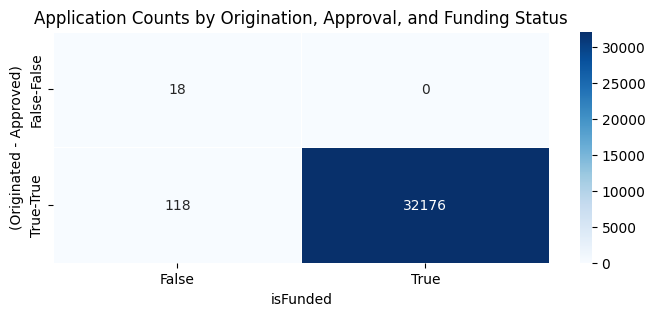

In [77]:
# Contingency table
contingency_tbl = clean_df.groupby(["originated", "approved", "isFunded"]).size().unstack(fill_value = 0)

# Heatmap
plt.figure(figsize = (8, 3))
sns.heatmap(contingency_tbl, annot = True, fmt = "d", cmap = "Blues", linewidths = 0.5)
plt.title("Application Counts by Origination, Approval, and Funding Status")
plt.xlabel("isFunded")
plt.ylabel("(Originated - Approved)")
plt.show();

del contingency_tbl;

The heatmap shows that loans which get both approved and originated are very likely to be funded. Only 118 approved and originated loans didn't get funded. Additionally, only 18 loans were neither approved nor originated, meaning most applications in the matched dataset were at least considered. On the other hand, if a loan doesn't make it past the origination and approval stages, it almost never gets funded. <p> Overall, the matched dataset suggests that getting a loan funded strongly depends on approval and origination. If a loan clears both stages, it's almost always funded. This's consistent with the fact that the dataset contains repayment data only for loans that were actually funded.

#### Target distribution
- Refer [Target derivation](#Target-derivation) for grouping description

In [78]:
# Calculate frequency counts and proportions for both columns
target_cnts = clean_df["target"].value_counts()
target_prop = clean_df["target"].value_counts(normalize = True)

# Group by target and category to get counts and proportions 
cat_cnts = clean_df.groupby(["target", "loanStatus"], observed = False).size().reset_index(name = "counts")
cat_cnts["proportion"] = cat_cnts["counts"] / len(clean_df)

# Create labels for the sunburst chart 
cat_cnts["cat_labels"] = cat_cnts["loanStatus"].astype(str)+" (n = " + cat_cnts["counts"].astype(str) + ", " + (cat_cnts["proportion"] * 100).round(2).astype(str) + "%)" 
cat_cnts["target_labels"] = cat_cnts["target"].map({0: "Safe", 1: "Risky"}) + "<br>"+" (n = " + cat_cnts["target"].map(target_cnts).astype(str) + ", "+ cat_cnts["target"].map(target_prop).apply(lambda x: f'{x: .2%}') + ")"

# Sunburst chart
fig = px.sunburst(cat_cnts, 
                  path = ["target_labels", "cat_labels"],  # Define the hierarchy of the categories
                  values = "counts"  # Define the size of the segments
                 )

fig.update_layout(title = dict(text = "<b>Sunburst plot of 'target' and 'loanStatus' with Counts and Proportions</b>",
                               x = 0.5,
                               y = 0.98,
                               xanchor = "center",
                               yanchor = "top"),
                  margin = dict(t = 50, l = 50, r = 50, b = 50),
                  width = 900,
                  height = 900,
                  uniformtext_mode = "show" # Ensure all text is shown
                 )

fig.show()


risky_cols = ["External Collection", "Internal Collection", "Returned Item", "Settled Bankruptcy", "Charged Off Paid Off", "Charged Off"]  
safe_cols = ["Paid Off Loan", "New Loan", "Pending Paid Off", "Settlement Paid Off", 
              "Credit Return Void", "Customer Voided New Loan", "CSR Voided New Loan",
              "Withdrawn Application"]
     
tbl = ((pd.DataFrame({"n": clean_df["loanStatus"].value_counts(dropna = False),
                      "Proportion (%)": clean_df["loanStatus"].value_counts(dropna = False, normalize = True).mul(100).round(3)
                     }
                    )
       ).T
      )

display(tbl.style.format(formatter = "{: .0f}", subset = pd.IndexSlice["n", :])
        .set_properties(subset = pd.IndexSlice[:, risky_cols], **{"background-color": "#ffb3b3"})
        .set_properties(subset = pd.IndexSlice[:, safe_cols], **{"background-color": "#e6ccff"})
       )

del target_cnts, target_prop, cat_cnts, fig, tbl, risky_cols, safe_cols;

loanStatus,External Collection,Paid Off Loan,New Loan,Internal Collection,Returned Item,Settlement Paid Off,Settled Bankruptcy,Pending Paid Off,Charged Off Paid Off,Credit Return Void,Customer Voided New Loan,CSR Voided New Loan,Withdrawn Application,Charged Off
n,9335,9086,6529,5134,1051,536,283,112,109,70,47,16,3,1
Proportion (%),28.890000,28.120000,20.206000,15.889000,3.253000,1.659000,0.876000,0.347000,0.337000,0.217000,0.145000,0.050000,0.009000,0.003000


The sunburst plot reveals that the target variable is approximately evenly distributed, with each class comprising $\approx 50\%$ of the data across the three datasets (loan, underwriting and payment) with matching IDs i.e. `underwritingid`, `clarityFraudId` and `loanId`. This balanced distribution suggests that class imbalance isn't a concern in this scenario.

Looking at the current status, most of the safe loans consist of fully paid-off loans (9086 or 28.12%), followed by new loans (6529 or 20.21%). This's a healthy sign, as these categories are typically favorable from a business perspective.

On the other hand, a significant portion of risky loans has already been sent to collections, both external (9335 or 28.89%) and internal (5134 or 15.89%). Trying to collect these loans usually costs extra money, which lowers the profit lenders can make from them.<p>This analysis shows both the successes with repaid loans and the challenges with unpaid or risky ones.

#### `loanAmount` and number of loan applications over time

In [79]:
# Seasonal pattern

# Extract year and month for grouping
clean_df["yr_mth"] = clean_df["applicationDate"].dt.to_period("M")

# Extract month component
clean_df["mth"] = clean_df["yr_mth"].dt.month

In [80]:
# Group by yr_mth and calculate loan application count and sum of loanAmount
mthly_df = clean_df.groupby("yr_mth").agg(application_cnt = ("applicationDate", "size"), 
                                          loanAmount = ("loanAmount", "sum")).reset_index()

# Ensure yr_mth is in correct format
mthly_df["yr_mth"] = mthly_df["yr_mth"].astype(str)

# Ensure application_cnt and loanAmount are numeric
mthly_df["application_cnt"] = pd.to_numeric(mthly_df["application_cnt"], errors = "coerce")
mthly_df["loanAmount"] = pd.to_numeric(mthly_df["loanAmount"], errors = "coerce")

mthly_df["scaled_amount"] = mthly_df["loanAmount"] / 1000000

In [81]:
# Create the plot for submission count and loanAmount using go.Scatter
fig = go.Figure()

# Add the submission count trace
fig.add_trace(go.Scatter(x = mthly_df["yr_mth"],
                         y = mthly_df["application_cnt"],
                         mode = "lines+markers",
                         name = "Application Count",
                         line = dict(color = "blue")))

# Add the loanAmount trace with a secondary y-axis
fig.add_trace(go.Scatter(x = mthly_df["yr_mth"],
                         y = mthly_df["scaled_amount"],
                         mode = "lines+markers",
                         name = "Loan Amount",
                         line = dict(color = "orange"),
                         yaxis = "y2"))

# Update layout for dual y-axes and legend
fig.update_layout(title = {"text": "Total Monthly Loan Application and Loan Amount",
                           "x": 0.45, 
                           "xanchor": "center",
                           "yanchor": "top",
                           "font":{"size": 24, 
                                   "family": "Arial Black", 
                                   "color": "black" 
                                  }
                            },
                  xaxis = dict(tickmode = "linear", tickformat = "%Y-%m", dtick = "M1"), # Monthly ticks
                  yaxis = dict(tickmode = "linear", tick0 = 0, dtick = 500, title = "Total number of loan applications"), # 500-interval ticks 
                  yaxis2 = dict(title = "Total Loan Amount (USD) <br> (in 1,000,000)",
                                overlaying = "y", # Overlay the secondary y-axis on top of the primary y-axis
                                side = "right", # Place the secondary y-axis on the right
                                tickformat = ".2f",  # 2 decimal places
                               ),
                  legend = dict(title = "Loan",
                                x = 1.1, # Position the legend outside the plot area to the right
                                y = 1, # Align the legend at the top
                                #bordercolor = "black",  # Add a border
                                #borderwidth = 1 # Set the border width
                               ),
                  width = 1300, 
                  height = 800
                 )

fig.show();

tbl = (mthly_df.melt(id_vars = ["yr_mth"], value_vars = ["application_cnt", "loanAmount"]) 
       .replace({"application_cnt": "Number of Loan Applications", "loanAmount": "Loan Amount (USD)"})
       .pivot(index = "variable", columns = "yr_mth", values = "value")
       .rename_axis(columns = "YYYY-MM")  
       .reindex(["Number of Loan Applications", "Loan Amount (USD)"])  # Reorder row order
        )

display(tbl.style
        .format(formatter = "{: .0f}", subset = pd.IndexSlice["Number of Loan Applications", :])
        .format(formatter = "{: .2f}", subset=pd.IndexSlice["Loan Amount (USD)", :]))

del mthly_df, fig, tbl;

YYYY-MM,2014-12,2015-01,2015-02,2015-03,2015-04,2015-05,2015-06,2015-07,2015-08,2015-09,2015-10,2015-11,2015-12,2016-01,2016-02,2016-03,2016-04,2016-05,2016-06,2016-07,2016-08,2016-09,2016-10,2016-11,2016-12,2017-01,2017-02,2017-03
variable,,,,,,,,,,,,,,,,,,,,,,,,,,,,
Number of Loan Applications,1,4,53,31,107,252,215,342,619,429,619,1353,1798,1405,804,1066,1362,879,1431,1161,1024,687,345,1386,5315,3999,3048,2577
Loan Amount (USD),1000.00,2500.00,38200.00,19575.00,55625.00,115550.00,102375.00,167175.00,347900.00,248286.00,340965.00,729811.00,966477.00,923372.00,475645.00,664882.00,1036150.00,568703.00,1068704.00,842600.00,781483.00,561341.00,227926.00,738623.00,3376319.50,2493789.00,2326823.00,1986206.00


The line graph above shows how the number of loan applications and the total amount of money borrowed changed over time. Both increased between December 2014 and March 2017, but there were times when they suddenly went up or down, showing periods when people were taking out more or fewer loans. 

From December 2014 to August 2015, both the number of loan applications and the total amount borrowed stayed low and steady. However, between September 2015 and October 2016, both started to rise, with some ups and downs along the way. The biggest jumps happened in December 2015, April 2016 and June 2016. 

The highest point in the graph is in December 2016, when both the number of loans and the total money borrowed reached their peak. This could be because of a special event or a time of year, like the holiday season, when more people needed money. After that, both numbers dropped quickly, which might mean that fewer people needed loans or that banks changed their lending rules. 

Overall, the graph demonstrates a strong connection between the number of applications and the total loan amount. When applications increase, loan amounts tend to rise, and when applications decrease, loan amounts fall accordingly.

#### `loanAmount` and number of loan applications by month

In [82]:
mthly_df = clean_df.groupby("mth").agg(application_cnt = ("applicationDate", "size"),
                                     loanAmount = ("loanAmount", "sum")).reset_index()

# Ensure application_cnt and loanAmount are numeric
mthly_df["application_cnt"] = pd.to_numeric(mthly_df["application_cnt"], errors = "coerce")
mthly_df["loanAmount"] = pd.to_numeric(mthly_df["loanAmount"], errors = "coerce")

mthly_df = mthly_df.sort_values(by = "application_cnt", ascending = False)

# Map month labels using the calendar module 
mthly_df["mth_label"] = mthly_df["mth"].map(lambda x: calendar.month_name[x])

# Add a new column with sequential values starting from 1 
mthly_df["Rank"] = range(1, len(mthly_df) + 1)

In [83]:
# Parallel Coordinates Plot
# https://plotly.com/python-api-reference/generated/plotly.graph_objects.Parcoords.html
# Reverse the minimum and maximum values for the Rank, so that the month with top rank comes on the top
dims = list([dict(range = (mthly_df["Rank"].max(),
                           mthly_df["Rank"].min()),
                  tickvals = mthly_df["Rank"],
                  ticktext = mthly_df["mth_label"],
                label = "Month",
                values = mthly_df["Rank"]),
             dict(range = (mthly_df["application_cnt"].min(),
                           mthly_df["application_cnt"].max()),
                label = "Number of loan application",
                  values = mthly_df['application_cnt']),
             dict(range = (mthly_df['loanAmount'].min(),
                           mthly_df["loanAmount"].max()),
                  label = "Loan Amount (USD)", values = mthly_df["loanAmount"]),
            ])
fig = go.Figure(data = go.Parcoords(line = dict(color = mthly_df["Rank"], colorscale = "picnic"), dimensions = dims))
fig = fig.update_layout(width = 1200, height = 800, margin = dict(l = 150, r = 60, t = 60, b = 40), font = dict(size = 15))
fig.show()

tbl = (mthly_df.melt(id_vars = ["Rank"], value_vars = ["mth_label", "application_cnt", "loanAmount"]) 
       .replace({"mth_label": "Month", "application_cnt": "Number of Loan Applications", "loanAmount": "Loan Amount (USD)"})
       .pivot(index = "variable", columns = "Rank", values = "value")
       .reindex(["Month", "Number of Loan Applications", "Loan Amount (USD)"])  # Reorder row order
        )

display(tbl.style
        .format(formatter = "{: .0f}", subset = pd.IndexSlice["Number of Loan Applications", :])
        .format(formatter = "{: .2f}", subset=pd.IndexSlice["Loan Amount (USD)", :]))

del mthly_df, dims, fig, tbl;

Rank,1,2,3,4,5,6,7,8,9,10,11,12
variable,,,,,,,,,,,,
Month,December,January,February,March,November,June,August,July,April,May,September,October
Number of Loan Applications,7114,5408,3905,3674,2739,1646,1643,1503,1469,1131,1116,964
Loan Amount (USD),4343796.50,3419661.00,2840668.00,2670663.00,1468434.00,1171079.00,1129383.00,1009775.00,1091775.00,684253.00,809627.00,568891.00


The parallel coordinates plot above shows how the number of loan applications and the total loan amount change across different months of the year.  

One clear trend is that December has the highest number of applications and the largest total loan amount. This suggests that borrowing activity tends to peak at the end of the year, possibly for holiday spending, travel or end of year business needs. On the other hand, October sees the lowest loan activity, with the fewest applications and the smallest loan amount. This may reflect a period of stability where less borrowing takes place and earlier loans are being repaid. 

The pattern in the chart also shows that when applications increase, the total loan amount rises as well, and when applications drop, the total loan amount decreases. This suggests that borrowing activity is driven by the volume of loans rather than being driven mainly by a few unusually large ones.

Looking at the months in more detail, borrowing remains fairly steady in the first half of the year, then starts to pick up in August. Activity dips into October, before rising again in November and then reaching its peak in December. This shows that the climb toward year end is not a straight line but a mix of ups and downs.

Overall, the chart highlights that borrowing is not evenly distributed across the year, likely for specific financial needs. The number of loan applications and the total amount borrowed follow a clear pattern, indicating that borrowing habits may be influenced by seasonal trends.

When looking at both charts together, it is easy to see that the big jump in December 2016 on the [line graph](#loanAmount-and-number-of-loan-applications-over-time) matches what happens most years since December is usually the busiest month for borrowing. The drop in October also matches with the monthly chart where October has the least activity. This shows that loans go up and down not only over time but also depending on the month of the year.

#### High-level or overall indicators 
- Acccording to the provided `clarity_underwriting_dictionary.xlsx` or `clarity_underwriting_dictionary.csv`

##### clearfraudscore   

- Fraud score provided by clarity
- Higher score suggests lower default probability

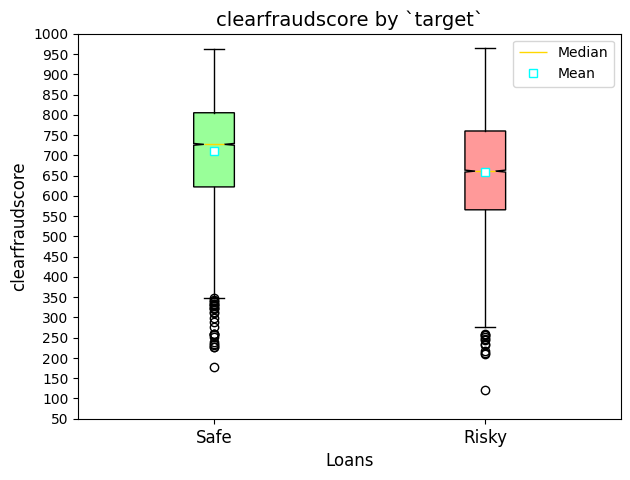

**- Summary Statistics:**

,count,mean,std,min,25%,50%,75%,max,range,IQR
target,,,,,,,,,,
Safe,16364,710.764,122.012,177.000,622.000,727.000,805.000,963.000,786.000,183.000
Risky,15855,659.416,127.210,122.000,565.500,661.000,760.000,965.000,843.000,194.500


In [84]:
boxplt_and_summary_stats(clean_df,
                         target_col = "target", feat_col = "clearfraudscore",
                         title = "clearfraudscore by `target`",
                         y_min = 50, y_max = 1000, step = 50)

The box and whisker plot shows that the median fraud score for safe loans is around 727, which is higher than the median score of 661 for risky loans. Similarly, the average fraud score for safe loans is 710.76, while for risky loans, it's 659.42. This suggests that, on average, safe loans tend to have higher fraud scores than risky loans. 

Looking at the spread of scores, both groups have a similar range, with standard deviations of around 122 - 127. The middle 50% of fraud scores for safe loans fall between 622 and 805, while for risky loans, they range from 565.5 to 760. This means that fraud scores for risky loans are more spread out compared to those for safe loans. 

There are also some unusual values in the data. Some loans have very low fraud scores, as shown by the small circles in the chart, which represent outliers. The lowest fraud score for safe loans is 177, while for risky loans, it's 122. On the higher end, the maximum fraud scores for both groups are nearly the same, around 963 - 965. 

One expected observation is that safe loans have higher fraud scores than risky loans.

##### cfind.totalnumberoffraudindicators
- Fraud Indicator: Total Number of unique fraud indicators

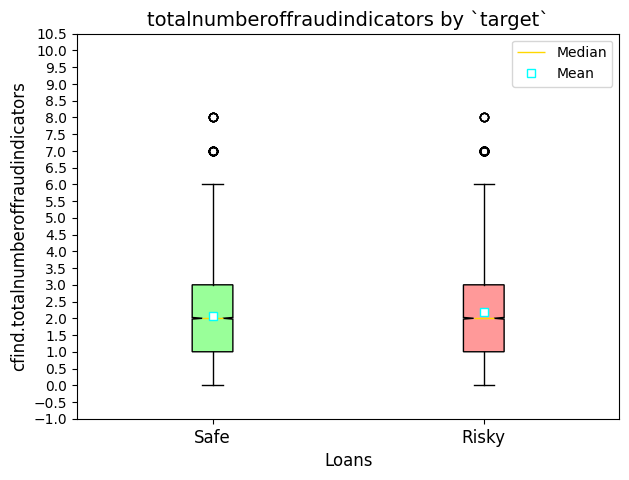

**- Summary Statistics:**

,count,mean,std,min,25%,50%,75%,max,range,IQR
target,,,,,,,,,,
Safe,16392,2.056,1.222,0.000,1.000,2.000,3.000,8.000,8.000,2.000
Risky,15903,2.179,1.285,0.000,1.000,2.000,3.000,8.000,8.000,2.000


In [85]:
boxplt_and_summary_stats(clean_df,
                         target_col = "target", feat_col = "cfind.totalnumberoffraudindicators",
                         title = "totalnumberoffraudindicators by `target`",
                         y_min = -1, y_max = 10, step = 0.5)

The box and whisker plot shows how the total number of fraud indicators is distributed for two types of loans,  safe and risky. The way the data is spread out looks quite similar for both groups. The middle 50% of the data, known as the interquartile range (IQR), is the same for both types of loans, with a value of 2.0. The median, which represents the middle value of the dataset, is also the same for both categories, at $\approx 2.0$. This means that, on average, the number of fraud indicators doesn't differ much between safe and risky loans. 

However, when looking at the average number of fraud indicators, the risky loans have a slightly higher value of 2.179 compared to 2.056 for safe loans. This suggests that, in general, risky loans tend to have a slightly greater number of fraud indicators, but the difference is tiny. The standard deviation, which measures how much the values vary from the average, is also quite similar for both groups. This indicates that the level of variation in fraud indicators doesn't differ significantly between the two loan categories. 

The fraud indicator values range from 0 to 8 in both groups, meaning that some loans have no fraud indicators at all while others have as many as eight. There are a few cases with much higher fraud indicator counts, which appear as outliers in the plot. These represent unusual loans with a significantly larger number of fraud indicators compared to the rest. In summary, while risky loans tend to have a slightly higher number of fraud indicators on average, the overall distribution of fraud indicators is very similar between the two groups. There is no major difference in how fraud indicators are spread between safe and risky loans.

##### cfindvrfy.nameaddressmatch
- Provides a high level indication of whether the name appears to belong with the address on the current application

In [86]:
plot_stacked_bar(clean_df, "cfindvrfy.nameaddressmatch")

**- Summary Statistics:**

target                      Risky                  Safe               
                           Counts Proportion (%) Counts Proportion (%)
cfindvrfy.nameaddressmatch                                            
match                        5590         45.959   6573         54.041
mismatch                     6053         51.913   5607         48.087
unavailable                  2103         51.068   2015         48.932
partial                      1786         49.283   1838         50.717
invalid                       365         50.624    356         49.376
NaN                            16         61.538     10         38.462

The stacked bar chart illustrates how loans are split into safe and risky loans, based on whether the name and address match.

Most of the loans fall under the *match* and *mismatch* categories. In the *match* group, there are more safe loans (54.04%) than risky loans (45.96%), which means that when the name and address match, the loan is usually safer. However, in the `mismatch` group, there are more risky loans (51.91%) than safe loans (48.09%), suggesting that when the name and address don't match, there is a higher chance of risk. 

For the *unavailable* and *partial* groups, the percentage of safe and risky loans is almost equal. The *partial* group has slightly more safe loans (50.72%) than risky loans (49.28%). The *invalid*` group is very balanced, but there are slightly more risky loans (50.62%). The *NaN* category, which means missing or unknown information, has more risky loans (61.54%) than safe loans (38.46%). This suggests that missing information could be linked to higher risk.

Overall, loans with a name and address match seem to be safer. If the information is missing or doesn't match, the loan is more likely to be risky.

##### cfindvrfy.overallmatchresult
- Provides a high level indication of whether key personal information from the current application appears to belong together

In [87]:
plot_stacked_bar(clean_df, "cfindvrfy.overallmatchresult", maxtickval = 24)

**- Summary Statistics:**

target                        Risky                  Safe               
                             Counts Proportion (%) Counts Proportion (%)
cfindvrfy.overallmatchresult                                            
partial                       11404         50.331  11254         49.669
match                          4364         46.465   5028         53.535
other                            94         54.335     79         45.665
mismatch                         35         55.556     28         44.444
NaN                              16         61.538     10         38.462

The chart shows the results of an overall match check for loans, comparing the number of safe and risky loans in different categories. The chart shows the results of an overall match check for loans, comparing the number of safe and risky loans in different categories. 

Most loans fall into the *partial* and *match* categories. In the *partial* category, the percentage of risky loans (50.33%) and safe loans (49.67%) is almost the same. This means that when the match is only partial, it doesn't clearly show if a loan is risky or safe. In the *match* category, there are more safe loans (53.53%) than risky ones (46.47%). This suggests that a full match is more common for safer loans. 

For the *other* category, risky loans (54.34%) are slightly more than safe loans (45.66%). This shows that when the match is unclear, the loan is a little more likely to be risky. The *mismatch* category has even more risky loans (55.56%) than safe ones (44.44%), meaning that if names and addresses don't match, the loan is more often risky. 

The *NaN* category, which means missing data, has the highest number of risky loans (61.54%), while safe loans are only 38.46%. This shows that when important information is missing, there is a higher chance that the loan is risky. <p> Overall, the chart shows that loans with matching information tend to be less risky, while those with mismatched or missing information are more likely to be risky.

##### cfindvrfy.ssnnamematch
- Provides a high level indication of whether the SSN appears to belong with the name on the current application

In [88]:
plot_stacked_bar(clean_df, "cfindvrfy.ssnnamematch", maxtickval = 30)

**- Summary Statistics:**

target                  Risky                  Safe               
                       Counts Proportion (%) Counts Proportion (%)
cfindvrfy.ssnnamematch                                            
match                   14212         49.217  14664         50.783
partial                  1046         48.924   1092         51.076
mismatch                  518         49.007    539         50.993
unavailable               117         56.522     90         43.478
NaN                        16         61.538     10         38.462
invalid                     4         50.000      4         50.000

The stacked bar chart shows how loans are classified as risky or safe based on the `ssnnamematch` category. 

The *match* category appears the most frequently, meaning most records have a matching SSN and name. In this group, the percentage of safe loans (50.78%) is slightly higher than risky loans (49.22%), showing a more balanced distribution. 

Other categories, such as *partial*, *mismatch*, *unavailable*, *NaN* and *invalid* have fewer records. it's interesting to note that in the *unavailable* category, the percentage of risky loans (56.52%) is higher than safe loans (43.48%). This suggests that when the SSN-name information is missing or unavailable, loans are more likely to be seen as risky. 

The *mismatch* category, where the SSN and name don't match, has nearly equal percentages of risky and safe loans, with 50.99% of loans classified as safe. <p> From this, we can see that having a correct SSN-name match is linked to lower risk, while missing or unavailable information might make a loan more likely to be classified as risky.

##### cfindvrfy.phonematchresult
- Provides a high level indication of whether the phone number appears to belong with the name and/or address on the current application

In [89]:
plot_stacked_bar(clean_df, "cfindvrfy.phonematchresult", maxtickval = 32)

**- Summary Statistics:**

target                      Risky                  Safe               
                           Counts Proportion (%) Counts Proportion (%)
cfindvrfy.phonematchresult                                            
unavailable                 15187         49.262  15642         50.738
match                         343         48.107    370         51.893
invalid                       201         45.270    243         54.730
partial                        86         54.430     72         45.570
mismatch                       76         56.716     58         43.284
NaN                            20         58.824     14         41.176

The stacked bar plot shows how phone match results relate to loan classifications as either risky or safe. The most common category in the data is *unavailable*, meaning there was no phone match information. In this group, the proportion of risky loans (49.26%) and safe loans (50.74%) is almost equal. This suggests that not having phone match data doesn't strongly indicate whether a loan is risky or not. 

For cases where the phone number doesn't match, the percentage of risky loans is higher, reaching 56.72%. Similarly, missing data (*NaN*) has an even greater proportion of risky loans at 58.82%. This suggests that when phone information is missing or incorrect, there is a greater chance that the loan is considered risky. On the other hand, when a phone *match* is found, the proportion of safe loans is slightly higher than risky loans. Even for *invalid* phone numbers, 54.73% of loans fall into the safe category, meaning that an incorrect phone number doesn't always mean a loan is more risky. 

Overall, missing or mismatched phone numbers tend to be linked to a higher percentage of risky loans. However, having a valid phone match doesn't guarantee that a loan is safe, but it does seem to create a more balanced distribution between safe and risky loans.

##### cfindvrfy.overallmatchreasoncode
- 125 possible values provide details to support overall match result as stated in the provided `clarity_underwriting_dictionary.csv` and `clarity_underwriting_dictionary.xlsx

**cfindvrfy.overallmatchreasoncode has** **74 unique values,** **including the missing values.**

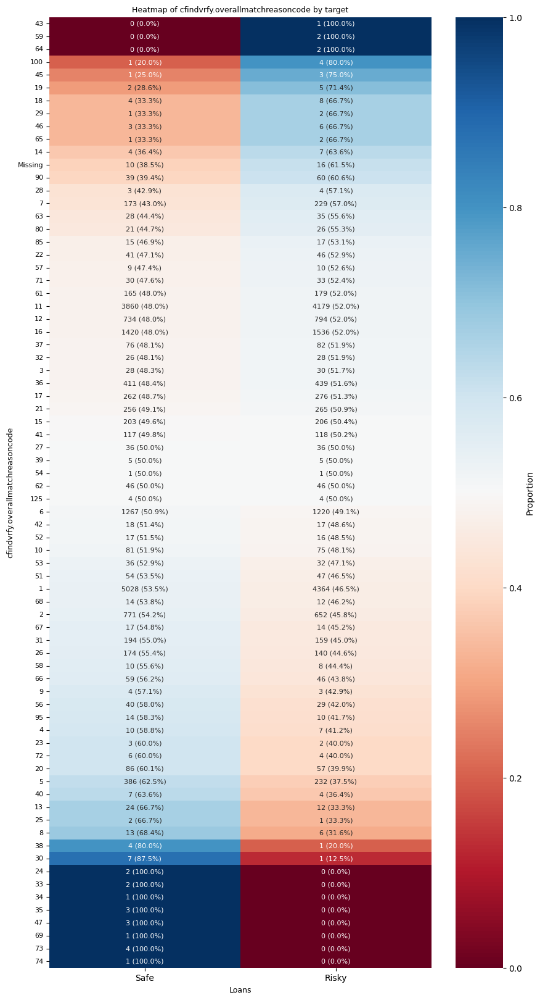

In [90]:
display(Markdown(f'**cfindvrfy.overallmatchreasoncode has** **{clean_df["cfindvrfy.overallmatchreasoncode"].nunique(dropna = False)} unique values,**'
                 f' **including the missing values.**'))

# Calculate counts
cnt_pivot = clean_df.assign(cfindvrfy_overallmatchreasoncode = clean_df["cfindvrfy.overallmatchreasoncode"]
                            .cat.add_categories("Missing").fillna("Missing")) \
                    .pivot_table(index = "cfindvrfy_overallmatchreasoncode", columns = "target", aggfunc = "size", fill_value = 0, observed = False)

# Calculate proportions
prop_pivot = cnt_pivot.div(cnt_pivot.sum(axis = 1), axis = 0)

# Reset the index to work with sorting
prop_pivot = prop_pivot.reset_index()

# Sort by descending order of proportion in column "1" and ascending order of reason codes
prop_pivot = prop_pivot.sort_values(by = [1, "cfindvrfy_overallmatchreasoncode"],
                                    ascending = [False, True])

# Set the index back to 'cfindvrfy.overallmatchreasoncode'
prop_pivot = prop_pivot.set_index("cfindvrfy_overallmatchreasoncode")

# Reorder the counts DataFrame to match the sorted proportions
cnt_pivot = cnt_pivot.loc[prop_pivot.index]

# Combine counts and proportion into a single DataFrame for annotation
annot = cnt_pivot.astype(str) + " (" + (prop_pivot * 100).round(1).astype(str) + "%)"

plt.figure(figsize = (10, 20))
ax = sns.heatmap(prop_pivot, annot = annot, fmt = "", cmap = "RdBu", cbar_kws = {"label": "Proportion"}, annot_kws = {"size": 8})
 
plt.title("Heatmap of cfindvrfy.overallmatchreasoncode by target", fontsize = 9)
plt.ylabel("cfindvrfy.overallmatchreasoncode", fontsize = 9)
plt.yticks(fontsize = 8)
plt.xlabel("Loans", fontsize = 9)

# Adjust x-tick labels to ensure they are centered
ax.set_xticks([0.5, 1.5]) # Set the tick positions in the middle of the columns
ax.set_xticklabels(["Safe", "Risky"]) # Set the labels

plt.show()

del cnt_pivot, prop_pivot, annot, ax;

The heatmap shows how different `cfindvrfy.overallmatchreasoncode` relate to safe and risky loans. The values in each box show the count and percentage for each `cfindvrfy.overallmatchreasoncode`. 

Despite the low counts for these codes, certain`cfindvrfy.overallmatchreasoncode`, like 43, 59 and 64 appear only in risky loans, while codes like 24, 33, 34, 35, 47, 69, 73 and 74 are found only in safe loans. This suggests that these codes are probably associated with riskier and safer loans respectively. Additionally, codes 27, 39, 54, 62 and 125 have equal proportions in both groups. 

The deeper the blue color, the higher the proportion of a given `cfindvrfy.overallmatchreasoncode` in either safe or risky loans.

##### cfindvrfy.ssndobmatch
- Provides a high level indication of whether the Social Security Number appears to belong with the date of birth on the current application

In [91]:
plot_stacked_bar(clean_df, "cfindvrfy.ssndobmatch", maxtickval = 27)

**- Summary Statistics:**

target                 Risky                  Safe               
                      Counts Proportion (%) Counts Proportion (%)
cfindvrfy.ssndobmatch                                            
match                  12760         49.385  13078         50.615
partial                 2250         50.167   2235         49.833
invalid                  702         44.628    871         55.372
mismatch                 151         46.605    173         53.395
unavailable               34         51.515     32         48.485
NaN                       16         61.538     10         38.462

The chart shows how different categories of `cfindvrfy.ssndobmatch` are divided between safe and risky loans. The *match* category is the most common and appears almost equally in both safe and risky loans, with 50.62% in safe loans and 49.38% in risky loans.

The *partial* category also has a similar proportion of risky and safe loans. For the *invalid* category, there are more safe loans than risky ones. The *mismatch* category shows more safe loans than risky loans. 

The *unavailable* category has slightly more risky loans compared to safe loans. Finally, the proportion of risky loans is highest in the absence of a matching code, compared to all other matching code categories. 

In summary, loans with matching information are generally more balanced in risk. Loans with *unavailable* or *NaN* information though rare are more likely to be risky.

#### `State` against `apr` and `loanAmount` by `target`
- According to the [correlation ratio](#Correlation):
  - `state` and `apr` is 0.8737
  - `state` and `loanAmount` is 0.6038
- According to the [Spearman's R](#Correlation):  
  - `apr` and `loanAmount` is -0.2127

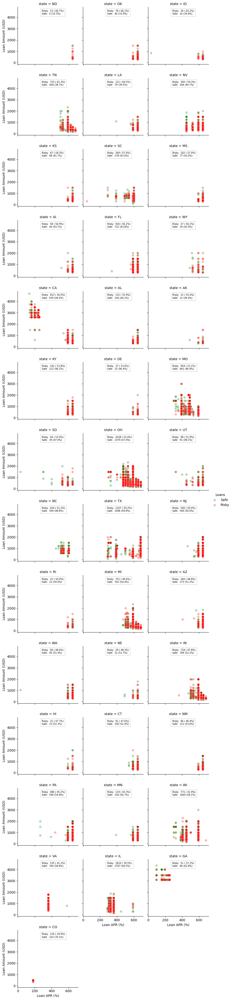

In [92]:
sub_df = clean_df[["target", "state", "apr", "loanAmount"]].copy()
sub_df["target_label"] = sub_df["target"].map({0: "Safe", 1: "Risky"})

# Compute count data by state and target
cnt_df = sub_df.groupby(["state", "target_label"], observed = False).size().reset_index(name = "Count")

# Compute state-wise proportions and counts
prop_df = (cnt_df.pivot(index = "state", columns = "target_label", values = "Count")
                 .assign(Total = lambda df: df.sum(axis = 1))
                 .assign(**{"Risky Proportion": lambda df: df["Risky"] / df["Total"],
                            "Safe Proportion": lambda df: df["Safe"] / df["Total"]
                           })
                 .sort_values("Risky Proportion", ascending = False)
          )

sorted_states = prop_df.index  # Sorted order of states

# Convert 'state' to categorical with sorted order
sub_df["state"] = pd.Categorical(sub_df["state"], categories = sorted_states, ordered = True)

# Sort sub_df to ensure correct order in FacetGrid
sub_df = sub_df.sort_values("state")

# Create state-specific proportion and count labels
prop_texts = {state: (f'Risky: {prop_df.loc[state, "Risky"]: .0f} ({prop_df.loc[state, "Risky Proportion"]: .1%})\n'
                      f'Safe: {prop_df.loc[state, "Safe"]: .0f} ({prop_df.loc[state, "Safe Proportion"]:.1%})')
              for state in sorted_states if state in prop_df.index
             }

# FacetGrid plot (ensuring correct state order)
g = sns.FacetGrid(sub_df, col = "state", hue = "target_label", col_wrap = 3, height = 3,
                  palette = {"Safe": "green", "Risky": "red"},
                  col_order = sorted_states)  # Ensure order is applied

g.map(sns.scatterplot, "apr", "loanAmount", s = 50, alpha = 0.3)
g.set_axis_labels("Loan APR (%)", "Loan Amount (USD)")
g.add_legend(title = "Loans", label_order = ["Safe", "Risky"])

# Annotate each subplot with correct state-specific proportions & counts
for ax, state in zip(g.axes.flat, sorted_states):  
    if state in prop_texts:
        ax.text(0.4, 0.95, prop_texts[state], 
                transform = ax.transAxes, fontsize = 7, verticalalignment = "top", 
                bbox = dict(facecolor = "white", alpha = 0.2, edgecolor = "black"))

plt.show();

del prop_df, prop_texts, g;

The FacetGrid plots illustrate the relationship between loan amounts and interest rates across different states, arranged in descending order based on the proportion of risky loans. Each plot represents a state, with green dots indicating safe loans and red dots representing risky loans. 

*North Dakota (ND)* has the highest proportion of risky loans at 66.7%, though it also has the fewest loans compared to other states. It's followed by *Oklahoma (OK)*, *Idaho (ID)* and so on. 

*Colorado (CO)* stands out for having the highest proportion of safe loans at 70.1%, mostly with lower interest rates. It's followed by *Georgia (GA)*, *Illinois (IL)* and others. 

*New Jersey (NJ)* and *Rhode Island (RI)* have an equal proportion of both safe and risky loans. 

In most states, loans are concentrated at the higher end of APR and the lower end of loan amounts, indicating that smaller loans often come with higher interest rates. However, *CO* doesn't follow this trend, as loans there tend to have both lower amounts and lower APRs. 

Interestingly, *California (CA)* displays two distinct loan clusters. The first cluster consists of loans with APRs between 100% and 300% and loan amounts mostly ranging from USD1,000 to USD4,000, with many loans around USD3,000. This group has a mix of both safe and risky loans. The second cluster is at the extreme high end of APR, between 500% and 600%, where loan amounts are typically USD1,000 to USD3,000, with many around USD2,000. Most of these loans are risky, with only a few classified as safe. 

Apart from *CA*, *Georgia (GA)* is another state where loans are mostly concentrated in the lower APR and higher loan amount range.

Both safe and risky loans show up in every state and across all types. This means that whether a loan becomes risky is not just about the loan size or the interest rate. It also depends on other things like past payment patterns, how much debt is linked to the loan compared to income and what is happening in the economy at the time.

Overall, the plots indicate an inverse relationship between APR and loan amount where high-interest loans are more common in many states and tend to carry higher risk. In contrast, loans with lower interest rates show a mix of both safe and risky loans.

In [93]:
# Print unlimited number of rows by setting to None, default is 10
pd.set_option('display.max_rows', None) 

# Galculate summary statistics by groups
sub_df.groupby(["state", "target_label"], observed = False).agg({"apr": ["count", "mean", "min", "median", "max", "std"],
                                                                 "loanAmount": ["count", "mean", "min", "median", "max", "std"]})

# Reset to default setting
pd.reset_option("display.max_rows") 

apr                                                  \
                   count        mean      min  median    max         std   
state target_label                                                         
AK    Risky           15  630.333333  590.000  645.00  645.0   25.175574   
      Safe            12  618.333333  490.000  645.00  645.0   47.258156   
AL    Risky          132  637.500000  590.000  645.00  645.0   18.946490   
      Safe           104  633.894231  590.000  645.00  645.0   22.185851   
AZ    Risky          260  633.304231  404.100  645.00  645.0   26.487933   
      Safe           273  635.439560  565.000  645.00  645.0   21.056406   
CA    Risky          813  426.786255  139.125  590.00  645.0  189.864231   
      Safe           639  361.378247  135.150  242.00  645.0  194.951067   
CO    Risky          134  180.200000  180.200  180.20  180.2    0.000000   
      Safe           314  180.200000  180.200  180.20  180.2    0.000000   
CT    Risky           91  629.890110  590.000  645.00  645.0   24.686681   
      Safe           100  621.850000  540.000  645.00  645.0   30.281966   
DE    Risky           37  634.594595  590.000  645.00  645.0   21.838370   
      Safe            32  634.687500  590.000  645.00  645.0   21.810677   
FL    Risky          926  621.841253  565.000  645.00  645.0   27.249313   
      Safe           722  625.380886  340.000  645.00  645.0   28.299475   
GA    Risky           51  205.607843   95.000  217.00  251.0   47.815511   
      Safe            86  187.058140   95.000  182.00  251.0   47.657196   
HI    Risky           21  631.904762  590.000  645.00  645.0   24.003968   
      Safe            23  633.043478  590.000  645.00  645.0   23.195764   
IA    Risky           58  632.672414  590.000  645.00  645.0   23.136049   
      Safe            44  633.295455  515.000  645.00  645.0   27.299868   
ID    Risky           30  628.500000  590.000  645.00  645.0   25.635038   
      Safe            16  603.124375   29.990  645.00  645.0  153.450364   
IL    Risky         1810  356.939227  288.000  360.00  590.0   16.092486   
      Safe          2767  355.539212  288.000  360.00  590.0   17.219537   
IN    Risky          718  598.165599  360.000  590.00  681.0   32.641126   
      Safe           784  597.074298  472.000  590.00  681.0   33.770968   
KS    Risky           67  633.507463  590.000  645.00  645.0   22.529693   
      Safe            48  640.416667  590.000  645.00  645.0   15.362061   
KY    Risky          142  627.183099  590.000  645.00  645.0   25.829946   
      Safe           122  633.278689  590.000  645.00  645.0   22.615822   
LA    Risky          121  633.884298  565.000  645.00  645.0   22.550754   
      Safe            79  633.797468  390.000  645.00  645.0   34.298979   
MI    Risky          751  598.736152  472.000  590.00  681.0   33.680476   
      Safe           762  594.978346  472.000  590.00  681.0   33.718559   
MN    Risky          119  632.521008  590.000  645.00  645.0   23.132576   
      Safe           156  629.807692  390.000  645.00  645.0   30.831931   
MO    Risky          954  514.539308  300.000  490.00  590.0   61.036656   
      Safe           841  497.050981  300.000  490.00  590.0   63.924922   
MS    Risky          102  636.372549  590.000  645.00  645.0   20.100698   
      Safe            77  636.428571  590.000  645.00  645.0   20.079728   
NC    Risky          624  593.486458  510.000  601.00  601.0   22.722564   
      Safe           594  585.236263  449.990  601.00  601.0   31.078067   
ND    Risky           12  645.000000  645.000  645.00  645.0    0.000000   
      Safe             6  645.000000  645.000  645.00  645.0    0.000000   
NE    Risky           29  629.827586  590.000  645.00  645.0   25.017235   
      Safe            31  626.129032  490.000  645.00  645.0   41.687522   
NJ    Risky          500  635.690000  565.000  645.00  645.0   20.773468   
      Safe           500  634.150000  465.000  645.00  645.0   23.726

#### `leadCost` and `leadType` by `target`
- According to the [correlation ratio](#Correlation):
  - `leadCost` and `leadType` is 0.7084.
  
The lead type determines the underwriting rules for a lead:
- `bvMandatory`: leads that are bought from the ping tree – required to perform bank verification before loan approval
- `lead`: very similar to `bvMandatory`, except bank verification is optional for loan approval
- `california`: similar to `lead`, but optimized for California lending rules
- `organic`: customers that came through the MoneyLion website
- `rc_returning`: customers who have at least 1 paid off loan in another loan portfolio. (The first paid off loan isn't in this data set).
- `prescreen`: preselected customers who have been offered a loan through direct mail campaigns
- `express`: promotional "express" loans
- `repeat`: promotional loans offered through sms
- `instant-offer`: promotional "instant-offer" loans
- `lionpay`

In [94]:
fig = px.box(clean_df, x = "leadCost", y = "leadType", color = "target",
             labels = {"target": "Loans", "leadCost": "Lead Cost (USD)", "leadType": "Lead Type"},
             title = "Box Plot of Lead Cost by Lead Type and Target",
             category_orders = {"target": [0, 1]},  #  Plot: "Red" bar in the top, "green" bar in the bottom
             color_discrete_map = {0: "green", 1: "red"},
             points = "suspectedoutliers",  # Show suspected outliers, includes means
             boxmode = "group")

fig.update_layout(title = {"x": 0.5, "font": {"size": 18, "weight": "bold"}}, 
                  width = 1200, height = 600, boxmode = "group",  # Ensures grouped boxes don't overlap
                  boxgap = 0.4,  # Adjusts spacing between each box
                  boxgroupgap = 0.5,  # Adjusts spacing between groups of boxes
                  legend_traceorder = "reversed", # Shows "red" on top and "green" on the bottom in the legend
                  legend = dict(x = 0.85,
                                y = 0.95,
                                bgcolor = "rgba(255, 255, 255, 0.4)"  # Adds a semi-transparent background
                               )                   
                 )

fig.update_traces(boxmean = True, opacity = 0.5)  # Light gray whisker color (adjust alpha for transparency)
                                      
fig.for_each_trace(lambda t: t.update(name = "Safe" if t.name == "0" else "Risky"))

fig.show();

plot_stacked_bar(clean_df, "leadType", maxtickval = 30)

# Summary statistics
summary_df = clean_df.groupby(["leadType", "target"], observed = False)["leadCost"].describe().fillna(0).reset_index()

# Convert target values (0 -> "Safe, 1 -> "Risky")
summary_df["target"] = summary_df["target"].map({0: "Safe", 1: "Risky"})
display(summary_df)

del fig;

**- Summary Statistics:**

target         Risky                  Safe               
              Counts Proportion (%) Counts Proportion (%)
leadType                                                 
bvMandatory     8390         57.368   6235         42.632
lead            5019         44.689   6212         55.311
organic         1856         37.495   3094         62.505
prescreen        595         45.489    713         54.511
rc_returning      37         27.007    100         72.993
california        16         32.653     33         67.347
instant-offer      0          0.000      8        100.000
lionpay            0          0.000      2        100.000
express            0          0.000      1        100.000
repeat             0          0.000      1        100.000

,leadType,target,count,mean,std,min,25%,50%,75%,max
0,bvMandatory,Safe,6235.0,4.775461,2.406535,3.0,3.0,3.0,6.0,11.0
1,bvMandatory,Risky,8390.0,4.749702,2.392083,3.0,3.0,3.0,6.0,11.0
2,california,Safe,33.0,165.151515,28.735998,120.0,170.0,170.0,170.0,200.0
3,california,Risky,16.0,140.625000,47.953971,10.0,120.0,120.0,170.0,200.0
4,express,Safe,1.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0
5,instant-offer,Safe,8.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0
6,lead,Safe,6212.0,33.703799,25.664302,0.0,25.0,25.0,40.0,200.0
7,lead,Risky,5019.0,31.641761,24.839556,0.0,25.0,25.0,40.0,200.0
8,lionpay,Safe,2.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0
9,organic,Safe,3094.0,0.136070,3.042097,0.0,0.0,0.0,0.0,115.0


The two charts provide information on how different lead types perform based on their cost and risk. The first chart, a box-whisker plot, shows the distribution of lead costs and whether they are linked to safe or risky loans. The second chart, a stacked bar chart, represents the proportion of risky and safe loans for each lead type. 

The box-whisker plot indicates that some lead types, including *lionpay*, *express*, *instant-offer*, *rc-returning*, *repeat* and *prescreen*, have a lead cost of zero. Among these, only *rc-returning* and *prescreen* contain risky loans, with 27% and 45.5% of loans categorized as risky respectively. The other four lead types consist entirely of safe loans, though they have a very low number of total loans. 

The *california* lead type has the highest average cost, followed by *lead* and *bvMandatory*, regardless of whether the loans are safe or risky. The difference in lead cost between safe and risky loans is most noticeable in *california* compared to other lead types. About one-third of the loans in this category are risky. The mean lead cost for safe loans in *california* is USD165.15, while for risky loans, it's lower at USD140. However, the median lead cost for safe loans is only USD5 higher than the mean, while for risky loans, the median is USD20 lower than the mean. This difference suggests that the distribution of lead costs for safe loans is slightly skewed to the left, whereas for risky loans, it's skewed to the right. 

The box-whisker plot shows that *bvMandatory* and *lead* have similar variability in lead cost, but *lead* has more outliers, regardless of loan risk. These two lead types account for the highest number of loans, with *lead* at 14,625 and *bvMandatory* at 11,231. However, they also have a high proportion of risky loans, at 57.4% and 44.7%, respectively. While these leads generate a significant number of loans, they also present a higher risk of financial loss. 

The stacked bar chart shows that the *organic* lead type has a lower proportion of risky loans at 37.5%. Its distribution in the box-whisker plot suggests that its cost is relatively stable, which may indicate a safer investment for the lender compared to *bvMandatory* and *lead*. 

The *organic* lead type appears to be a better option, as 62.5% of its loans are safe and it has one of the lowest and most stable costs. This makes it a less risky and more predictable choice compared to other lead types. 

One way to handle this is to stop putting so much attention on leads that often end up risky. It might be smarter to spend more effort and money on the ones that usually work out better. Just because a lead is more expensive does not mean it is safer. That is why it is important to watch costs carefully. If some leads keep turning into too many risky loans, it may be better to use them less or even stop using them so the business does not lose money.

#### First Payment Status

In [95]:
plot_stacked_bar(clean_df, "fpStatus")

**- Summary Statistics:**

target     Risky                  Safe               
          Counts Proportion (%) Counts Proportion (%)
fpStatus                                             
Checked    11263         41.639  15786         58.361
Rejected    4524         93.723    303          6.277
Cancelled     34         19.883    137         80.117
NaN            5          3.546    136         96.454
Skipped       87         71.901     34         28.099
Pending        0          0.000      3        100.000

The chart and table above give a simple view of how safe and risky loans appear at the stage of the first payment. When the first payment is *Checked*, most of the loans fall into the safe group, while a smaller but still noticeable share are risky. This means that a *Checked* first payment usually points toward safety, though it is not a guarantee.

When the first payment is *Rejected*, the pattern is much clearer. Almost all of these loans are risky, and only a very small number are safe. A rejected first payment strongly connects with risk.

*Cancelled* loans show something different. Most of the cancelled loans are safe, with only a small number being risky. This suggests that cancellation often happens for reasons unrelated to risk, and it does not necessarily reflect poor quality.

*Skipped* payments lean heavily toward risky loans. Most of the skipped loans are risky, while fewer are safe. This makes skipped payments appear more closely tied to risk. Pending loans are all safe, but the number is very small. The few loans with missing information (*NaN*) are also mostly safe but too limited to affect the overall results.

Overall, the picture is clear. *Checked* loans are mostly safe but include some risk. *Rejected* and *Skipped* loans are strongly linked to risk. *Cancelled* loans are mostly safe and do not show the same level of concern. These differences highlight how the first payment status gives an early sense of whether a loan is safe or risky.

#### hasCF

In [96]:
plot_stacked_bar(clean_df, "hasCF", maxtickval = 34)

**- Summary Statistics:**

target  Risky                  Safe               
       Counts Proportion (%) Counts Proportion (%)
hasCF                                             
True    15913         49.248  16399         50.752

All the loans in the matched data have `hasCF = True`, indicating that this feature provides no discriminatory power for risk assessment, as the proportions of risky loans (49.25%) and safe loans (50.75%) are nearly identical. On top of that, there's no explanation of what `hasCF` actually means in the data dictionary.

#### Numerical features by `target`
- Acccording to the provided `clarity_underwriting_dictionary.xlsx` or `clarity_underwriting_dictionary.csv`:
    - clear-fraud-stabilities 
      - `cfinq.oneminuteago` ([Correlation ratio](#Correlation) = -0.0636)
        - Number of unique inquiries for the consumer seen by Clarity in the last 1 minute
      - `cfinq.tenminutesago` ([Correlation ratio](#Correlation) = -0.0101)
        - Number of unique inquiries for the consumer seen by Clarity in the last 10 minutes
      - `cfinq.onehourago` ([Correlation ratio](#Correlation) = 0.0116)
         - Number of unique inquiries for the consumer seen by Clarity in the last 1 hour
      - `cfinq.twentyfourhoursago` ([Correlation ratio](#Correlation) = 0.0404)
        - Number of unique inquiries for the consumer seen by Clarity in the last 24 hours
      - `cfinq.sevendaysago` ([Correlation ratio](#Correlation) = 0.0806)
        - Number of unique inquiries for the consumer seen by Clarity in the last 7 days
      - `cfinq.fifteendaysago` ([Correlation ratio](#Correlation) = 0.0985)
        - Number of unique inquiries for the consumer seen by Clarity in the last 15 days
      - `cfinq.thirtydaysago` ([Correlation ratio](#Correlation) = 0.1163)
        - Number of unique inquiries for the consumer seen by Clarity in the last 30 days
      - `cfinq.ninetydaysago` [Correlation ratio](#Correlation) = 0.1277
        - Number of unique inquiries for the consumer seen by Clarity in the last 90 days
      - `cfinq.threesixtyfivedaysago` ([Correlation ratio](#Correlation) = 0.1081)
        - Number of unique inquiries for the consumer seen by Clarity in the last 365 days
- `nPaidOff` ([Correlation ratio](#Correlation) = -0.1257)
    - How many MoneyLion loans this client has paid off in the past
- `originallyScheduledPaymentAmount` ([Correlation ratio](#Correlation) = 0.0038)
  - Originally scheduled repayment amount (if a customer pays off all his scheduled payments, This's the amount we should receive)
- `loanAmount`([Correlation ratio](#Correlation) = 0.0919)

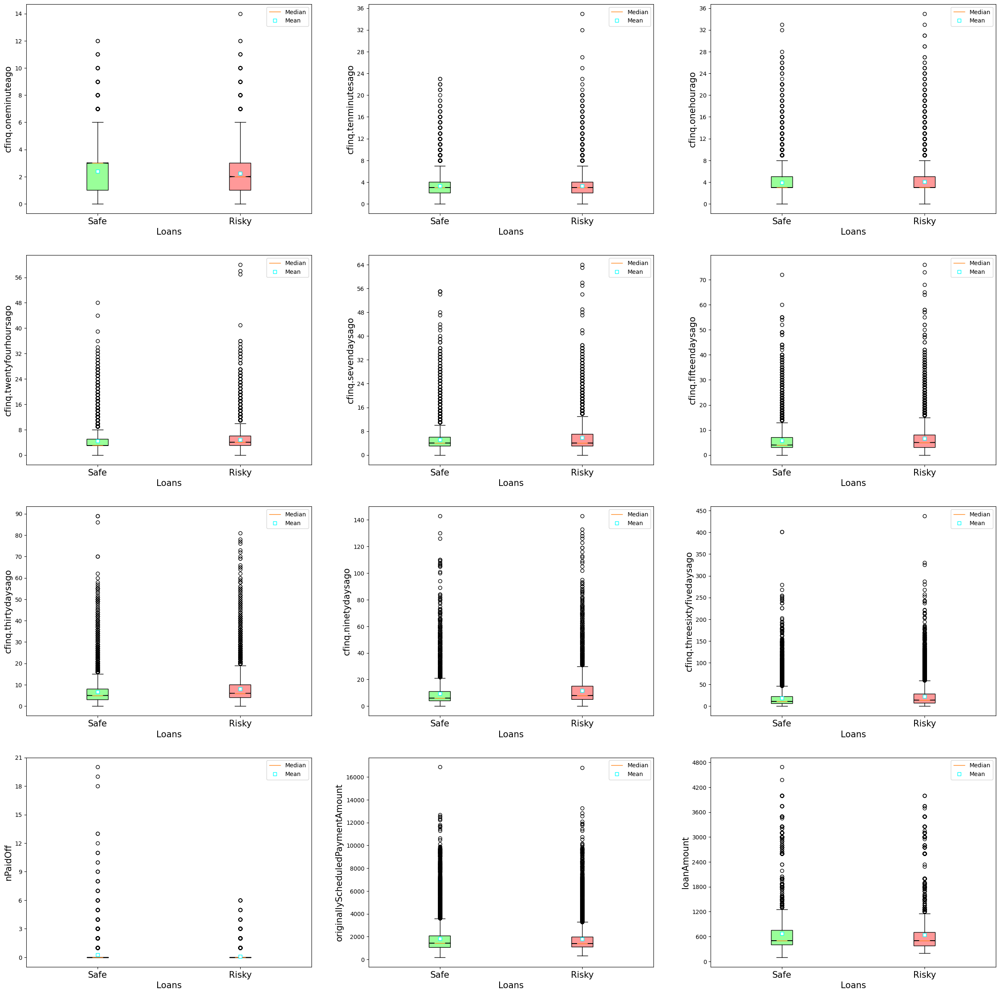

**- Summary Statistics:**

n       Mean         SD  Min  \
Numerical features               Loans                                      
cfinq.oneminuteago               Safe   16,399      2.392      1.411    0   
                                 Risky  15,912      2.242      1.450    0   
                                 Total  32,311      2.318      1.432    0   
cfinq.tenminutesago              Safe   16,399      3.268      2.035    0   
                                 Risky  15,912      3.303      2.233    0   
                                 Total  32,311      3.285      2.135    0   
cfinq.onehourago                 Safe   16,399      3.939      2.606    0   
                                 Risky  15,912      4.080      2.862    0   
                                 Total  32,311      4.008      2.736    0   
cfinq.twentyfourhoursago         Safe   16,399      4.485      3.221    0   
                                 Risky  15,912      4.776      3.522    0   
                                 Total  32,311      4.628      3.376    0   
cfinq.sevendaysago               Safe   16,399      5.155      3.969    0   
                                 Risky  15,912      5.777      4.442    0   
                                 Total  32,311      5.461      4.220    0   
cfinq.fifteendaysago             Safe   16,399      5.773      4.717    0   
                                 Risky  15,912      6.645      5.382    0   
                                 Total  32,311      6.202      5.074    0   
cfinq.thirtydaysago              Safe   16,399      6.742      5.972    0   
                                 Risky  15,912      8.016      6.890    0   
                                 Total  32,311      7.370      6.472    0   
cfinq.ninetydaysago              Safe   16,399      9.489      9.680    0   
                                 Risky  15,912     11.787     11.421    0   
                                 Total  32,311     10.621     10.635    0   
cfinq.threesixtyfivedaysago      Safe   16,399     18.185     21.986    0   
                                 Risky  15,912     22.556     25.455    0   
                                 Total  32,311     20.338     23.858    0   
nPaidOff                         Safe   16,398      0.240      0.743    0   
                                 Risky  15,912      0.100      0.387    0   
                                 Total  32,310      0.171      0.599    0   
originallyScheduledPaymentAmount Safe   16,399  1,819.210  1,350.319  188   
                                 Risky  15,913  1,790.096  1,270.922  335   
                                 Total  32,312  1,804.872  1,311.879  188   
loanAmount                       Safe   16,399    674.425    509.336  100   
                                 Risky  15,913    637.725    480.830  200   
                                 Total  32,312    656.351    495.835  100   

                                               Q1     Median         Q3  \
Numerical features               Loans                                    
cfinq.oneminuteago               Safe       1.000      3.000      3.000   
                                 Risky      1.000      2.000      3.000   
                                 Total      1.000      3.000      3.000   
cfinq.tenminutesago              Safe       2.000      3.000      4.000   
                                 Risky      2.000      3.000      4.000   
                                 Total      2.000      3.000      4.000   
cfinq.onehourago                 Safe       3.000      3.000      5.000   
                                 Risky      3.000      3.000      5.000   
                                 Total      3.000      3.000      5.000   
cfinq.twentyfourhoursago         Safe       3.000      3.000      5.000   
                                 Risky      3.000      4.000      6.000   
                                 Total      3.000      3.000      5.000   
cfinq.sevendaysago               Safe       3.000      4.000      6.

In [97]:
# Filter out rows with NaN in target or feature columns
sub_df = clean_df[["target",
                   "cfinq.oneminuteago", "cfinq.tenminutesago", "cfinq.onehourago", 
                   "cfinq.twentyfourhoursago", "cfinq.sevendaysago", "cfinq.fifteendaysago", 
                   "cfinq.thirtydaysago", "cfinq.ninetydaysago", "cfinq.threesixtyfivedaysago",
                   "nPaidOff", "originallyScheduledPaymentAmount", "loanAmount"]].dropna()

# Extract numerical features dynamically while preserving order
numerical_feat = sub_df.columns[1:].tolist()  # Exclude "target"

fig, ax = plt.subplots(nrows = 4, ncols = 3, figsize = (30, 30))

for idx, feat in enumerate(numerical_feat):
    lst0 = sub_df[sub_df["target"] == 0][feat].tolist()
    lst1 = sub_df[sub_df["target"] == 1][feat].tolist()
    cols = [lst0, lst1]

    # Compute the subplot indices
    row_idx = idx // 3
    col_idx = idx % 3

    # Create the box plot with mean markers
    box = ax[row_idx, col_idx].boxplot(cols, notch = True, patch_artist = True, showmeans = True,
                                       meanprops = {"marker": "s", "markerfacecolor": "white", "markeredgecolor": "Cyan"})

    ax[row_idx, col_idx].yaxis.set_major_locator(MaxNLocator(integer = True))
    ax[row_idx, col_idx].set_xticklabels(["Safe", "Risky"], size = 15)
    ax[row_idx, col_idx].set_xlabel("Loans", size = 15)
    ax[row_idx, col_idx].set_ylabel(feat, size = 15)

    colors = ["#99FF99", "#FF9999"]
    for patch, color in zip(box["boxes"], colors):
        patch.set_facecolor(color)

    # Add legend for median and mean markers
    ax[row_idx, col_idx].legend([box["medians"][0], box["means"][0]], ["Median", "Mean"], loc = "upper right")

# Dynamically remove empty subplots
num_plots = len(numerical_feat)
num_rows, num_cols = ax.shape

for idx in range(num_plots, num_rows * num_cols):
    fig.delaxes(ax.flatten()[idx])  # Remove unused axes

plt.show();

# Apply the same order used in numerical_feat (from the plots)
ordered_feat = ["target",
                "cfinq.oneminuteago", "cfinq.tenminutesago", "cfinq.onehourago", 
                "cfinq.twentyfourhoursago", "cfinq.sevendaysago", "cfinq.fifteendaysago", 
                "cfinq.thirtydaysago", "cfinq.ninetydaysago", "cfinq.threesixtyfivedaysago",
                "nPaidOff", "originallyScheduledPaymentAmount", "loanAmount"]

df = clean_df.copy()

df["target"] = clean_df["target"].replace([0, 1], [2, 2])  # For the `Total` row
df = pd.concat([df[ordered_feat], clean_df[ordered_feat]], ignore_index = True).groupby("target").describe(include = "all").sort_index()

# Function for formatting the summary statistics table 
def sumstatsfmt(df):
    df.rename(index = {0: "Safe", 1: "Risky", 2: "Total"},
              columns = {"count": "n", "mean": "Mean", "std": "SD", "min": "Min",
                         "25%": "Q1", "50%": "Median", "75%": "Q3", "max": "Max"},
              inplace = True)

    fmts = {"n": "{:,.0f}", "Mean": "{:,.3f}", "SD": "{:,.3f}", "Min": "{:,.0f}", "Q1": "{:,.3f}",
            "Median": "{:,.3f}", "Q3": "{:,.3f}", "Max": "{:,.0f}"}
    
    for col, fmt in fmts.items():
        df[col] = df[col].map(lambda x: fmt.format(x))
    return df

# Summary statistics table
display(Markdown(f'**- Summary Statistics:**'))
df = df.unstack().unstack(1).sort_index(level=[0, 1]).rename_axis(index = ("Numerical features", "Loans"), 
                                                                  axis = 1)

df = df[["count", "mean", "std", "min", "25%", "50%", "75%", "max"]]

# Reorder columns explicitly
df = df.reindex(ordered_feat, level = 0)

with pd.option_context("display.max_rows", 70):  
    display(sumstatsfmt(df))

del sub_df, numerical_feat, fig, ax, idx, feat, lst0, lst1, cols, row_idx, col_idx, ordered_feat, df;

The box plots, when viewed alongside the tables, clearly show that the biggest differences between safe and risky loan holders lie in how many MoneyLion loans they've successfully paid off in the past, and the number of unique inquiries recorded for them by Clarity.

Risky loan holders consistently have more inquiries over every period measured from the last 10 minutes all the way to the last 365 days. The gap doesn’t just exist, it grows with time. For example, in the last 30 days, risky loan holders averaged 8 inquiries compared to 6.7 for safe ones, and over 90 days, the difference gets even wider. Risky loan holders also show more unpredictable and extreme behavior, with much higher variability and some outliers making an exceptionally high number of inquiries like 438 in just 365 days. That’s more than one inquiry per day for an entire year.

But inquiry activity is only part of the picture. For both safe and risky loans, most cases show no history of paid-off loans with MoneyLion. That’s why the median and even the upper quartile are both zero for the two groups. Safe loans, though, are about twice as likely to have at least one paid-off loan compared to risky loans. On average, the numbers are higher for safe loans, even though the typical case is still zero. What really stands out is at the top end. In the safe loan group, a few cases show a long history of loans being paid off, with as many as twenty. In the risky loan group, the best record is much smaller, no more than six. This shows that the strongest repayment histories are only found with safe loans and not with risky ones.

Other features, like the loan amount or the size of scheduled payments, show only modest differences between the groups. Safe loan are slightly more likely to have larger scheduled payments and loan amounts, but these differences aren’t as pronounced as those shown by repayment history and inquiry patterns.

#### Repayment Alignment
- Based on `originallyScheduledPaymentAmount` and total [successful](#Add-payment_df) payments by `target`
- `Repayment Alignment`
  - *Equal*: total [successful](#Add-payment_df) `paymentAmount` = `originallyScheduledPaymentAmount`
  - *Over*: total [successful](#Add-payment_df) `paymentAmount` > `originallyScheduledPaymentAmount`
  - *Under*: "total [successful](#Add-payment_df) `paymentAmount` < `originallyScheduledPaymentAmount`

In [98]:
repymt_align_df = clean_df.copy()

repymt_align_df["Repayment Alignment"] = np.where(repymt_align_df["paymentAmount_tot"] == repymt_align_df["originallyScheduledPaymentAmount"], "Equal",
                                                  np.where(repymt_align_df["paymentAmount_tot"] > repymt_align_df["originallyScheduledPaymentAmount"], 
                                                           "Over", 
                                                           "Under"))

fig = px.parallel_categories(repymt_align_df.assign(Target = repymt_align_df["target"]
                                                    .map({0: "Safe", 1: "Risk"}))
                             .rename(columns = {"loanStatus": "Current Loan Status"}),
                             dimensions = ["Repayment Alignment", "Current Loan Status", "Target"],
    color = repymt_align_df["Repayment Alignment"].astype("category").cat.codes)

fig.update_layout(width = 1300, height = 700, font = dict(size = 13))

fig.show()

display(pd.crosstab(index = repymt_align_df["loanStatus"],
                    columns = [repymt_align_df["target"].map({0: "Safe", 1: "Risky"}),
                               repymt_align_df["Repayment Alignment"]],
                    margins = True,
                    margins_name = "Total",
                    rownames = ["Loan Status"],
                    colnames = ["Target", "Repayment Alignment"]).T)

del repymt_align_df, fig;

Loan Status                 CSR Voided New Loan  Charged Off  \
Target Repayment Alignment                                     
Risky  Equal                                  0            0   
       Over                                   0            0   
       Under                                  0            1   
Safe   Equal                                  0            0   
       Over                                   0            0   
       Under                                 16            0   
Total                                        16            1   

Loan Status                 Charged Off Paid Off  Credit Return Void  \
Target Repayment Alignment                                             
Risky  Equal                                   0                   0   
       Over                                    0                   0   
       Under                                 109                   0   
Safe   Equal                                   0                   0   
       Over                                    0                   0   
       Under                                   0                  70   
Total                                        109                  70   

Loan Status                 Customer Voided New Loan  External Collection  \
Target Repayment Alignment                                                  
Risky  Equal                                       0                    0   
       Over                                        0                    5   
       Under                                       0                 9330   
Safe   Equal                                       0                    0   
       Over                                        0                    0   
       Under                                      47                    0   
Total                                             47                 9335   

Loan Status                 Internal Collection  New Loan  Paid Off Loan  \
Target Repayment Alignment                                                 
Risky  Equal                                  0         0              0   
       Over                                   1         0              0   
       Under                               5133         0              0   
Safe   Equal                                  0         1           2329   
       Over                                   0         1            335   
       Under                                  0      6527           6422   
Total                                      5134      6529           9086   

Loan Status                 Pending Paid Off  Returned Item  \
Target Repayment Alignment                                    
Risky  Equal                               0              0   
       Over                                0              0   
       Under                               0           1051   
Safe   Equal                               1              0   
       Over                                1              0   
       Under                             110              0   
Total                                    112           1051   

Loan Status                 Settled Bankruptcy  Settlement Paid Off  \
Target Repayment Alignment                                            
Risky  Equal                                 1                    0   
       Over                                  0                    0   
       Under                               282                    0   
Safe   Equal                                 0                    2   
       Over                                  0                    5   
       Under                                 0                  529   
Total                                      283                  536   

Loan Status                 Withdrawn Application  Total  
Target Repayment Alignment                                
Risky  Equal                                    0      1  
       Ove

When looking at the table and the Sankey diagram together, the overall story is clear. *Safe* loans usually turn out fine while *risky* loans mostly don't.

For *safe* loans, most records end either as paid off loans or as new loans. This happens even when the successful repayment amount is less than what was originally scheduled. That's a little surprising because underpayment would normally create more negative outcomes but here many still fall into positive categories. The Sankey diagram highlights this with large flows from underpayments into paid off loans and new loans.

For *risky* loans, the picture is very different. Most of them end in collections whether external or internal. The table shows thousands of risky loans with underpayments that were directed into collections and the diagram makes this stand out with thick streams flowing in that direction.

There're also some details that don't seem to line up neatly. One case shows equal repayment alignment yet the outcome's bankruptcy which feels inconsistent. Another detail is that only 348 loans fall into the overpayment category out of $> 32000$ total loans. That's $\approx 1\%$. It isn't literally just a few but it's still a very small fraction compared to the total number of loans. More cases where extra payments are recorded might be expected.

A reasonable explanation for these odd results could be timing. Payments aren't always settled instantly and loan statuses may be updated before all activity is fully processed. That could make some loans appear underpaid even though later payments arrived. It could also explain why an account that looks fully paid might still be shown as bankrupt.

So overall the main message is consistent. *Safe* loans are mostly resolved positively and *risky* loans mostly end in collections. The smaller odd cases are probably not real mistakes but are more likely due to the way payment records and loan statuses are updated at different times.

# Save processed data
Save the DataFrame as Parquet instead of CSV because it's faster, more memory-efficient and works better across data science tools.

In [99]:
# Save as a parquet file
clean_df.to_parquet(f'{temp_dir}/clean_df.parquet', engine = "pyarrow")

In [100]:
# Check: Load parquet file
df = pd.read_parquet(f'{temp_dir}/clean_df.parquet', engine = "pyarrow")
df.info(verbose = "all")

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 32312 entries, 0 to 32311
Data columns (total 284 columns):
 #    Column                                           Dtype         
---   ------                                           -----         
 0    cfinq.thirtydaysago                              Int32         
 1    cfinq.twentyfourhoursago                         Int32         
 2    cfinq.oneminuteago                               Int32         
 3    cfinq.onehourago                                 Int32         
 4    cfinq.ninetydaysago                              Int32         
 5    cfinq.sevendaysago                               Int32         
 6    cfinq.tenminutesago                              Int32         
 7    cfinq.fifteendaysago                             Int32         
 8    cfinq.threesixtyfivedaysago                      Int32         
 9    cfind.inquiryonfilecurrentaddressconflict        boolean       
 10   cfind.totalnumberoffraudindicators          

# Session Information
Log the full session environment including OS, CPU, Python version and loaded modules to support reproducibility and assist in debugging environment-specific issues.

In [101]:
import importlib
importlib.metadata.version("markupsafe")

'3.0.2'

In [102]:
display(Markdown(f"<span style = 'font-size: 18px; font-weight: bold;'> Session Information </span>"))

# https://pypi.org/project/session-info/
session_info.show(na = True, os = True, cpu = True, jupyter = True, dependencies = True,
                  std_lib = True, private = True, write_req_file = False, req_file_name = None, html = None
                 )

<span style = 'font-size: 18px; font-weight: bold;'> Session Information </span>

C:\Users\grace\AppData\Local\Programs\Python\Python311\Lib\site-packages\session_info\main.py:213: UserWarning:

The '__version__' attribute is deprecated and will be removed in MarkupSafe 3.1. Use feature detection, or `importlib.metadata.version("markupsafe")`, instead.

